In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model, metrics

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import os
import statsmodels.api as sm
from sklearn.feature_selection import RFE
# hide warnings
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier


In [2]:
df=pd.read_csv('train.csv')

In [3]:
df.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,NaN,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,Na

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Columns: 172 entries, id to churn_probability
dtypes: float64(135), int64(28), object(9)
memory usage: 91.9+ MB


In [5]:
df.isnull().sum()/len(df)*100

id                           0.000000
circle_id                    0.000000
loc_og_t2o_mou               1.002871
std_og_t2o_mou               1.002871
loc_ic_t2o_mou               1.002871
last_date_of_month_6         0.000000
last_date_of_month_7         0.570008
last_date_of_month_8         1.047158
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  3.954342
onnet_mou_7                  3.838626
onnet_mou_8                  5.290076
offnet_mou_6                 3.954342
offnet_mou_7                 3.838626
offnet_mou_8                 5.290076
roam_ic_mou_6                3.954342
roam_ic_mou_7                3.838626
roam_ic_mou_8                5.290076
roam_og_mou_6                3.954342
roam_og_mou_7                3.838626
roam_og_mou_8                5.290076
loc_og_t2t_mou_6             3.954342
loc_og_t2t_mou_7             3.838626
loc_og_t2t_mou_8             5.290076
loc_og_t2m_m

In [6]:
df.loc_ic_t2o_mou.dtype


dtype('float64')

In [7]:

df['loc_og_t2o_mou'].fillna(df['loc_og_t2o_mou'].mean(), inplace=True)

In [8]:
df['std_og_t2t_mou_7'].fillna(df['std_og_t2t_mou_7'].mean(), inplace=True)

In [9]:
df.date_of_last_rech_data_6.dtype

dtype('O')

In [10]:



df['loc_ic_t2f_mou_8'].fillna(df['loc_ic_t2f_mou_8'].mean(), inplace=True)

In [11]:

df['loc_ic_t2o_mou'].fillna(df['loc_ic_t2o_mou'].mean(), inplace=True)

In [12]:
df.isnull().sum()/len(df)*100

id                           0.000000
circle_id                    0.000000
loc_og_t2o_mou               0.000000
std_og_t2o_mou               1.002871
loc_ic_t2o_mou               0.000000
last_date_of_month_6         0.000000
last_date_of_month_7         0.570008
last_date_of_month_8         1.047158
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  3.954342
onnet_mou_7                  3.838626
onnet_mou_8                  5.290076
offnet_mou_6                 3.954342
offnet_mou_7                 3.838626
offnet_mou_8                 5.290076
roam_ic_mou_6                3.954342
roam_ic_mou_7                3.838626
roam_ic_mou_8                5.290076
roam_og_mou_6                3.954342
roam_og_mou_7                3.838626
roam_og_mou_8                5.290076
loc_og_t2t_mou_6             3.954342
loc_og_t2t_mou_7             3.838626
loc_og_t2t_mou_8             5.290076
loc_og_t2m_m

In [13]:

df['onnet_mou_6'].fillna(df['onnet_mou_6'].mean(), inplace=True)

In [14]:

df['onnet_mou_7'].fillna(df['onnet_mou_7'].mean(), inplace=True)

In [15]:

df['onnet_mou_8'].fillna(df['onnet_mou_8'].mean(), inplace=True)

In [16]:



df['onnet_mou_8'].fillna(df['onnet_mou_8'].mean(), inplace=True)

In [17]:

df['offnet_mou_8'].fillna(df['offnet_mou_8'].mean(), inplace=True)

In [18]:






df['offnet_mou_6'].fillna(df['offnet_mou_6'].mean(), inplace=True)

In [19]:

df['offnet_mou_7'].fillna(df['offnet_mou_7'].mean(), inplace=True)

In [20]:

df['roam_ic_mou_6'].fillna(df['roam_ic_mou_6'].mean(), inplace=True)

In [21]:

df['roam_ic_mou_7'].fillna(df['roam_ic_mou_7'].mean(), inplace=True)

In [22]:

df['roam_ic_mou_8'].fillna(df['roam_ic_mou_8'].mean(), inplace=True)

In [23]:

df['roam_og_mou_7'].fillna(df['roam_og_mou_7'].mean(), inplace=True)

In [24]:

df['roam_og_mou_6'].fillna(df['roam_og_mou_6'].mean(), inplace=True)

In [25]:

df['roam_og_mou_8'].fillna(df['roam_og_mou_8'].mean(), inplace=True)

In [26]:
df.drop(['circle_id'],axis=1,inplace=True)

In [27]:
df.isnull().sum()/len(df)*100

id                           0.000000
loc_og_t2o_mou               0.000000
std_og_t2o_mou               1.002871
loc_ic_t2o_mou               0.000000
last_date_of_month_6         0.000000
last_date_of_month_7         0.570008
last_date_of_month_8         1.047158
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  0.000000
onnet_mou_7                  0.000000
onnet_mou_8                  0.000000
offnet_mou_6                 0.000000
offnet_mou_7                 0.000000
offnet_mou_8                 0.000000
roam_ic_mou_6                0.000000
roam_ic_mou_7                0.000000
roam_ic_mou_8                0.000000
roam_og_mou_6                0.000000
roam_og_mou_7                0.000000
roam_og_mou_8                0.000000
loc_og_t2t_mou_6             3.954342
loc_og_t2t_mou_7             3.838626
loc_og_t2t_mou_8             5.290076
loc_og_t2m_mou_6             3.954342
loc_og_t2m_m

In [28]:






df.churn_probability.dtype

dtype('int64')

In [29]:
df.loc_og_t2o_mou.dtype

dtype('float64')

<AxesSubplot:xlabel='loc_og_t2o_mou', ylabel='churn_probability'>

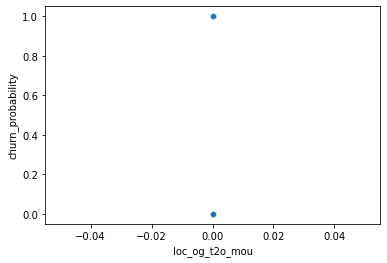

In [30]:
sns.scatterplot(df["loc_og_t2o_mou"],df["churn_probability"])


<AxesSubplot:xlabel='loc_og_t2o_mou', ylabel='churn_probability'>

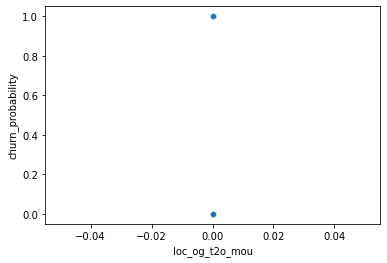

In [31]:


sns.scatterplot(x='loc_og_t2o_mou',y='churn_probability',data=df)

In [32]:
df['std_og_t2o_mou'].fillna(df['std_og_t2o_mou'].mean(), inplace=True)

In [33]:
df.std_og_t2o_mou.dtype

dtype('float64')

In [34]:
df['loc_og_t2t_mou_6'].fillna(df['loc_og_t2t_mou_6'].mean(), inplace=True)

In [35]:

df.loc_og_t2t_mou_7.dtype

dtype('float64')

In [36]:
df['loc_og_t2t_mou_7'].fillna(df['loc_og_t2t_mou_7'].mean(), inplace=True)

In [37]:
df['loc_og_t2t_mou_8'].fillna(df['loc_og_t2t_mou_8'].mean(), inplace=True)

In [38]:
df['loc_og_t2m_mou_7'].fillna(df['loc_og_t2m_mou_7'].mean(), inplace=True)

In [39]:
df['loc_og_t2m_mou_8'].fillna(df['loc_og_t2m_mou_8'].mean(), inplace=True)

In [40]:






df['loc_og_t2m_mou_6'].fillna(df['loc_og_t2m_mou_6'].mean(), inplace=True)

In [41]:
df['loc_og_t2f_mou_7'].fillna(df['loc_og_t2f_mou_7'].mean(), inplace=True)

In [42]:
df['loc_og_t2f_mou_6'].fillna(df['loc_og_t2t_mou_6'].mean(), inplace=True)

In [43]:




df['loc_og_t2f_mou_8'].fillna(df['loc_og_t2f_mou_8'].mean(), inplace=True)

In [44]:
df.loc_og_t2t_mou_8.dtype

dtype('float64')

In [45]:



df['loc_og_t2c_mou_8'].fillna(df['loc_og_t2c_mou_8'].mean(), inplace=True)

In [46]:
df['loc_og_t2c_mou_7'].fillna(df['loc_og_t2c_mou_7'].mean(), inplace=True)

In [47]:

df['loc_og_t2c_mou_8'].fillna(df['loc_og_t2c_mou_8'].mean(), inplace=True)

In [48]:
df['std_og_mou_6'].fillna(df['std_og_mou_6'].mean(), inplace=True)

In [49]:
df.std_og_mou_6.dtype

dtype('float64')

In [50]:


df['std_og_mou_7'].fillna(df['std_og_mou_7'].mean(), inplace=True)

In [51]:
df['std_og_mou_8'].fillna(df['std_og_mou_8'].mean(), inplace=True)

In [52]:
df['isd_og_mou_6'].fillna(df['isd_og_mou_6'].mean(), inplace=True)

In [53]:
df['isd_og_mou_7'].fillna(df['isd_og_mou_7'].mean(), inplace=True)

In [54]:
df['isd_og_mou_8'].fillna(df['isd_og_mou_8'].mean(), inplace=True)

In [55]:
df['loc_og_t2c_mou_6'].fillna(df['loc_og_t2c_mou_6'].mean(), inplace=True)

In [56]:
df['loc_og_mou_6'].fillna(df['loc_og_mou_6'].mean(), inplace=True)

In [57]:
df['loc_og_mou_8'].fillna(df['loc_og_mou_8'].mean(), inplace=True)

In [58]:




df['loc_og_mou_7'].fillna(df['loc_og_mou_7'].mean(), inplace=True)

In [59]:




df['std_og_t2t_mou_6'].fillna(df['std_og_t2t_mou_6'].mean(), inplace=True)

In [60]:
df['std_og_t2t_mou_7'].fillna(df['std_og_t2t_mou_7'].mean(), inplace=True)

In [61]:
df['std_og_t2t_mou_8'].fillna(df['std_og_t2t_mou_8'].mean(), inplace=True)

In [62]:
df['std_og_t2m_mou_6'].fillna(df['std_og_t2m_mou_6'].mean(), inplace=True)

In [63]:
df['std_og_t2m_mou_7'].fillna(df['std_og_t2m_mou_7'].mean(), inplace=True)

In [64]:
df['std_og_t2m_mou_8'].fillna(df['std_og_t2m_mou_8'].mean(), inplace=True)

In [65]:
df['std_og_t2f_mou_6'].fillna(df['std_og_t2f_mou_6'].mean(), inplace=True)

In [66]:
df['std_og_t2f_mou_7'].fillna(df['std_og_t2f_mou_7'].mean(), inplace=True)

In [67]:

df['std_og_t2f_mou_8'].fillna(df['std_og_t2f_mou_8'].mean(), inplace=True)

In [68]:
df['std_og_t2c_mou_6'].fillna(df['std_og_t2c_mou_6'].mean(), inplace=True)

In [69]:
df['std_og_t2c_mou_7'].fillna(df['std_og_t2c_mou_7'].mean(), inplace=True)

In [70]:
df['std_og_t2c_mou_8'].fillna(df['std_og_t2c_mou_8'].mean(), inplace=True)

In [71]:
df.last_date_of_month_7.value_counts()

7/31/2014    69600
Name: last_date_of_month_7, dtype: int64

In [72]:
df['spl_og_mou_6'].fillna(df['spl_og_mou_6'].mean(), inplace=True)

In [73]:
df['spl_og_mou_7'].fillna(df['spl_og_mou_7'].mean(), inplace=True)

In [74]:
df['spl_og_mou_8'].fillna(df['spl_og_mou_8'].mean(), inplace=True)

In [75]:
df['og_others_6'].fillna(df['og_others_6'].mean(), inplace=True)

In [76]:
df['og_others_7'].fillna(df['og_others_7'].mean(), inplace=True)

In [77]:
df['og_others_8'].fillna(df['og_others_8'].mean(), inplace=True)

In [78]:
df.drop('last_date_of_month_6',axis=1,inplace=True)

In [79]:




df.drop('last_date_of_month_7',axis=1,inplace=True)

In [80]:
df.drop('last_date_of_month_8',axis=1,inplace=True)

In [81]:


df['loc_ic_t2t_mou_6'].fillna(df['loc_ic_t2t_mou_6'].mean(), inplace=True)

In [82]:
df['loc_ic_t2t_mou_7'].fillna(df['loc_ic_t2t_mou_7'].mean(), inplace=True)

In [83]:
df['loc_ic_t2t_mou_8'].fillna(df['loc_ic_t2t_mou_8'].mean(), inplace=True)

In [84]:
df['loc_ic_t2m_mou_6'].fillna(df['loc_ic_t2m_mou_6'].mean(), inplace=True)

In [85]:
df['loc_ic_t2m_mou_7'].fillna(df['loc_ic_t2m_mou_7'].mean(), inplace=True)

In [86]:
df['loc_ic_t2m_mou_8'].fillna(df['loc_ic_t2m_mou_8'].mean(), inplace=True)

In [87]:
df['loc_ic_t2f_mou_6'].fillna(df['loc_ic_t2f_mou_6'].mean(), inplace=True)

In [88]:


df['loc_ic_t2f_mou_7'].fillna(df['loc_ic_t2f_mou_7'].mean(), inplace=True)

In [89]:
df['loc_ic_t2f_mou_8'].fillna(df['loc_ic_t2f_mou_8'].mean(), inplace=True)

In [90]:
df['loc_ic_mou_6'].fillna(df['loc_ic_mou_6'].mean(), inplace=True)

In [91]:
df['loc_ic_mou_7'].fillna(df['loc_ic_mou_7'].mean(), inplace=True)

In [92]:
df['loc_ic_mou_8'].fillna(df['loc_ic_mou_8'].mean(), inplace=True)

In [93]:
df['std_ic_t2t_mou_6'].fillna(df['std_ic_t2t_mou_6'].mean(), inplace=True)

In [94]:
df['std_ic_t2t_mou_7'].fillna(df['std_ic_t2t_mou_7'].mean(), inplace=True)

In [95]:
df['std_ic_t2t_mou_8'].fillna(df['std_ic_t2t_mou_8'].mean(), inplace=True)

In [96]:

df['std_ic_t2m_mou_6'].fillna(df['std_ic_t2m_mou_6'].mean(), inplace=True)

In [97]:
df['std_ic_t2m_mou_7'].fillna(df['std_ic_t2m_mou_7'].mean(), inplace=True)

In [98]:
df['std_ic_t2m_mou_8'].fillna(df['std_ic_t2m_mou_8'].mean(), inplace=True)

In [99]:
df['std_ic_t2f_mou_6'].fillna(df['std_ic_t2f_mou_6'].mean(), inplace=True)

In [100]:
df['std_ic_t2f_mou_7'].fillna(df['std_ic_t2f_mou_7'].mean(), inplace=True)

In [101]:
df['std_ic_t2f_mou_8'].fillna(df['std_ic_t2f_mou_8'].mean(), inplace=True)

In [102]:
df['std_ic_t2o_mou_6'].fillna(df['std_ic_t2o_mou_6'].mean(), inplace=True)

In [103]:


df['std_ic_t2o_mou_7'].fillna(df['std_ic_t2o_mou_7'].mean(), inplace=True)

In [104]:
df['std_ic_t2o_mou_8'].fillna(df['std_ic_t2o_mou_8'].mean(), inplace=True)

In [105]:
df['spl_ic_mou_6'].fillna(df['spl_ic_mou_6'].mean(), inplace=True)

In [106]:
df.total_rech_data_6.value_counts()

1.0     9289
2.0     3610
3.0     1457
4.0      928
5.0      560
6.0      413
7.0      310
8.0      248
9.0      174
10.0     145
11.0     114
12.0      96
14.0      47
13.0      42
15.0      24
17.0      21
16.0      21
18.0      11
20.0      11
22.0       9
19.0       7
23.0       4
24.0       4
21.0       4
25.0       4
32.0       2
40.0       2
29.0       2
35.0       2
46.0       1
28.0       1
27.0       1
26.0       1
33.0       1
61.0       1
34.0       1
Name: total_rech_data_6, dtype: int64

In [107]:
df['spl_ic_mou_7'].fillna(df['spl_ic_mou_7'].mean(), inplace=True)

In [108]:
df['spl_ic_mou_8'].fillna(df['spl_ic_mou_8'].mean(), inplace=True)

In [109]:
df.last_day_rch_amt_7.dtype

dtype('int64')

In [110]:
df['std_ic_mou_6'].fillna(df['std_ic_mou_6'].mean(), inplace=True)

In [111]:
df['std_ic_mou_7'].fillna(df['std_ic_mou_7'].mean(), inplace=True)

In [112]:
df['std_ic_mou_8'].fillna(df['std_ic_mou_8'].mean(), inplace=True)

In [113]:
df['isd_ic_mou_6'].fillna(df['isd_ic_mou_6'].mean(), inplace=True)

In [114]:
df['isd_ic_mou_7'].fillna(df['isd_ic_mou_7'].mean(), inplace=True)

In [115]:
df['isd_ic_mou_8'].fillna(df['isd_ic_mou_8'].mean(), inplace=True)

In [116]:
df['ic_others_6'].fillna(df['ic_others_6'].mean(), inplace=True)

In [117]:
df['ic_others_7'].fillna(df['ic_others_7'].mean(), inplace=True)

In [118]:
df['ic_others_8'].fillna(df['ic_others_8'].mean(), inplace=True)

In [119]:
df.isnull().sum()/len(df)*100

id                           0.000000
loc_og_t2o_mou               0.000000
std_og_t2o_mou               0.000000
loc_ic_t2o_mou               0.000000
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  0.000000
onnet_mou_7                  0.000000
onnet_mou_8                  0.000000
offnet_mou_6                 0.000000
offnet_mou_7                 0.000000
offnet_mou_8                 0.000000
roam_ic_mou_6                0.000000
roam_ic_mou_7                0.000000
roam_ic_mou_8                0.000000
roam_og_mou_6                0.000000
roam_og_mou_7                0.000000
roam_og_mou_8                0.000000
loc_og_t2t_mou_6             0.000000
loc_og_t2t_mou_7             0.000000
loc_og_t2t_mou_8             0.000000
loc_og_t2m_mou_6             0.000000
loc_og_t2m_mou_7             0.000000
loc_og_t2m_mou_8             0.000000
loc_og_t2f_mou_6             0.000000
loc_og_t2f_m

In [120]:
df.drop('date_of_last_rech_data_6',axis=1,inplace=True)

In [121]:
df.drop('date_of_last_rech_data_7',axis=1,inplace=True)

In [122]:
df.drop('date_of_last_rech_data_8',axis=1,inplace=True)

In [123]:
df['day_of_6th_month']=pd.DatetimeIndex(df['date_of_last_rech_6']).day

In [124]:
df.day_of_6th_month.value_counts()

30.0    11880
29.0     9049
27.0     7800
28.0     6752
26.0     3918
25.0     3402
24.0     2888
17.0     2887
14.0     2686
21.0     2654
23.0     2060
18.0     1886
12.0     1746
22.0     1624
13.0     1468
19.0     1387
20.0     1252
16.0      783
15.0      605
11.0      398
8.0       368
5.0       229
7.0       223
10.0      200
3.0       172
1.0       155
9.0       135
6.0       123
4.0        90
2.0        78
Name: day_of_6th_month, dtype: int64

<AxesSubplot:xlabel='day_of_6th_month', ylabel='churn_probability'>

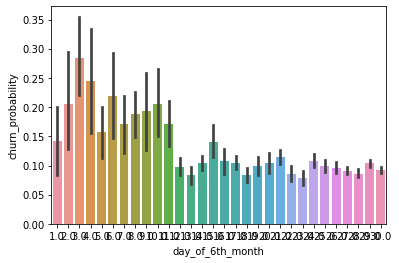

In [125]:
sns.barplot(x='day_of_6th_month',y='churn_probability',data=df)
# this plot shows everyday details for june month


In [126]:
df['day_of_7th_month']=pd.DatetimeIndex(df['date_of_last_rech_7']).day

<AxesSubplot:xlabel='day_of_7th_month', ylabel='churn_probability'>

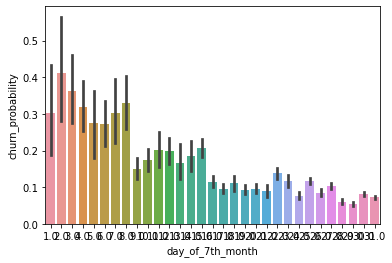

In [127]:
sns.barplot(x='day_of_7th_month',y='churn_probability',data=df)
#this is plot evryday for july months it shows  constant trend from 16th og july month although there is flucatuaion  but it very low

In [128]:
df['day_of_8th_month']=pd.DatetimeIndex(df['date_of_last_rech_8']).day

<AxesSubplot:xlabel='day_of_8th_month', ylabel='churn_probability'>

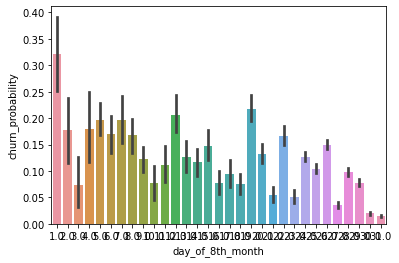

In [129]:




sns.barplot(x='day_of_8th_month',y='churn_probability',data=df)
# there are ups and downs in august month and it is high for first day

In [130]:
df.isna().sum()/len(df)*100

id                      0.000000
loc_og_t2o_mou          0.000000
std_og_t2o_mou          0.000000
loc_ic_t2o_mou          0.000000
arpu_6                  0.000000
arpu_7                  0.000000
arpu_8                  0.000000
onnet_mou_6             0.000000
onnet_mou_7             0.000000
onnet_mou_8             0.000000
offnet_mou_6            0.000000
offnet_mou_7            0.000000
offnet_mou_8            0.000000
roam_ic_mou_6           0.000000
roam_ic_mou_7           0.000000
roam_ic_mou_8           0.000000
roam_og_mou_6           0.000000
roam_og_mou_7           0.000000
roam_og_mou_8           0.000000
loc_og_t2t_mou_6        0.000000
loc_og_t2t_mou_7        0.000000
loc_og_t2t_mou_8        0.000000
loc_og_t2m_mou_6        0.000000
loc_og_t2m_mou_7        0.000000
loc_og_t2m_mou_8        0.000000
loc_og_t2f_mou_6        0.000000
loc_og_t2f_mou_7        0.000000
loc_og_t2f_mou_8        0.000000
loc_og_t2c_mou_6        0.000000
loc_og_t2c_mou_7        0.000000
loc_og_t2c

In [131]:
df.drop(['date_of_last_rech_6'],axis=1,inplace=True)

In [132]:
df.drop(['date_of_last_rech_7'],axis=1,inplace=True)

In [133]:
df.drop(['date_of_last_rech_8'],axis=1,inplace=True)

In [134]:
df['total_rech_data_6']=df['total_rech_data_6'].fillna(0)

In [135]:

df['total_rech_data_7']=df['total_rech_data_7'].fillna(0)

In [136]:
df['total_rech_data_8']=df['total_rech_data_8'].fillna(0)

In [137]:
df['max_rech_data_6']=df['max_rech_data_6'].fillna(0)

In [138]:
df['max_rech_data_7']=df['max_rech_data_7'].fillna(0)

In [139]:
df['max_rech_data_8']=df['max_rech_data_8'].fillna(0)

In [140]:
df['count_rech_2g_6']=df['count_rech_2g_6'].fillna(0)

In [141]:
df['count_rech_2g_7']=df['count_rech_2g_7'].fillna(0)

In [142]:
df['count_rech_2g_8']=df['count_rech_2g_8'].fillna(0)

In [143]:
df['count_rech_3g_6']=df['count_rech_3g_6'].fillna(0)

In [144]:
df['count_rech_3g_7']=df['count_rech_3g_7'].fillna(0)

In [145]:
df['count_rech_3g_8']=df['count_rech_3g_8'].fillna(0)

In [146]:
df.av_rech_amt_data_6.dtypes

dtype('float64')

In [147]:
df['av_rech_amt_data_6']=df['av_rech_amt_data_6'].fillna(0)

In [148]:
df['av_rech_amt_data_7']=df['av_rech_amt_data_7'].fillna(0)

In [149]:
df['av_rech_amt_data_8']=df['av_rech_amt_data_8'].fillna(0)

In [150]:
df['arpu_3g_6'].fillna(df['arpu_3g_6'].mean(), inplace=True)

In [151]:
df['arpu_3g_7'].fillna(df['arpu_3g_7'].mean(), inplace=True)

In [152]:
df['arpu_3g_8'].fillna(df['arpu_3g_8'].mean(), inplace=True)

In [153]:
df['night_pck_user_6'].fillna(df['night_pck_user_6'].mode()[0], inplace=True)

<AxesSubplot:xlabel='night_pck_user_6', ylabel='churn_probability'>

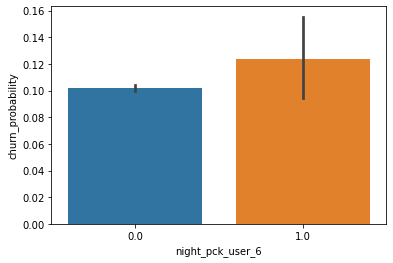

In [154]:
sns.barplot(x='night_pck_user_6',y='churn_probability',data=df)
#churn is more for night pack user for june month

In [155]:
df.night_pck_user_6.value_counts()

0.0    69555
1.0      444
Name: night_pck_user_6, dtype: int64

In [156]:
df['night_pck_user_7'].fillna(df['night_pck_user_7'].mode()[0], inplace=True)

In [157]:
df['night_pck_user_8'].fillna(df['night_pck_user_8'].mode()[0], inplace=True)

In [158]:
df['arpu_2g_6'].fillna(df['arpu_2g_6'].mean(), inplace=True)

In [159]:
df['arpu_2g_7'].fillna(df['arpu_2g_7'].mean(), inplace=True)

In [160]:
df['arpu_2g_8'].fillna(df['arpu_2g_8'].mean(), inplace=True)

<AxesSubplot:xlabel='aug_vbc_3g', ylabel='churn_probability'>

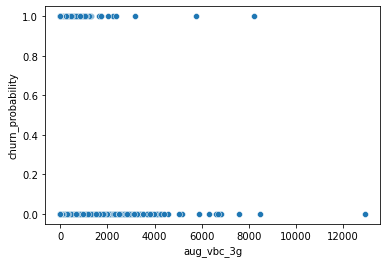

In [161]:
sns.scatterplot(x='aug_vbc_3g',y='churn_probability',data=df)# No trend 

<AxesSubplot:xlabel='sachet_3g_6', ylabel='churn_probability'>

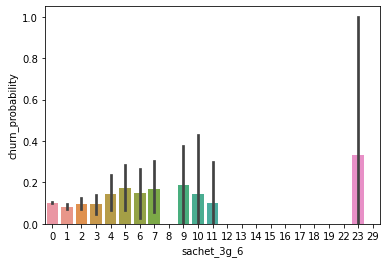

In [162]:
sns.barplot(x='sachet_3g_6',y='churn_probability',data=df)

<AxesSubplot:xlabel='sachet_2g_6', ylabel='churn_probability'>

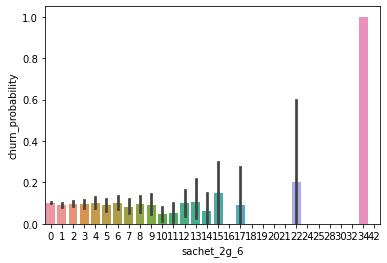

In [163]:
sns.barplot(x='sachet_2g_6',y='churn_probability',data=df)

In [164]:
df['fb_user_6'].fillna(df['fb_user_6'].mode()[0], inplace=True)

<AxesSubplot:xlabel='fb_user_6', ylabel='churn_probability'>

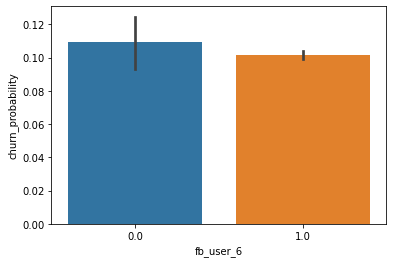

In [165]:
sns.barplot(x='fb_user_6',y='churn_probability',data=df)
#churn is slighly less in fb_user in june

In [166]:
df.fb_user_6.dtype

dtype('float64')

In [167]:
df['fb_user_7'].fillna(df['fb_user_7'].mode()[0], inplace=True)

<AxesSubplot:xlabel='fb_user_7', ylabel='churn_probability'>

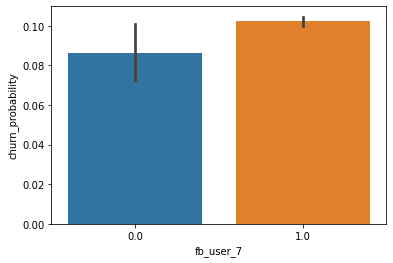

In [168]:
sns.barplot(x='fb_user_7',y='churn_probability',data=df)
#Fb_user will  churn  in july

In [169]:
df['fb_user_8'].fillna(df['fb_user_8'].mode()[0], inplace=True)

In [170]:
df.isna().sum()/len(df)*100

id                    0.000000
loc_og_t2o_mou        0.000000
std_og_t2o_mou        0.000000
loc_ic_t2o_mou        0.000000
arpu_6                0.000000
arpu_7                0.000000
arpu_8                0.000000
onnet_mou_6           0.000000
onnet_mou_7           0.000000
onnet_mou_8           0.000000
offnet_mou_6          0.000000
offnet_mou_7          0.000000
offnet_mou_8          0.000000
roam_ic_mou_6         0.000000
roam_ic_mou_7         0.000000
roam_ic_mou_8         0.000000
roam_og_mou_6         0.000000
roam_og_mou_7         0.000000
roam_og_mou_8         0.000000
loc_og_t2t_mou_6      0.000000
loc_og_t2t_mou_7      0.000000
loc_og_t2t_mou_8      0.000000
loc_og_t2m_mou_6      0.000000
loc_og_t2m_mou_7      0.000000
loc_og_t2m_mou_8      0.000000
loc_og_t2f_mou_6      0.000000
loc_og_t2f_mou_7      0.000000
loc_og_t2f_mou_8      0.000000
loc_og_t2c_mou_6      0.000000
loc_og_t2c_mou_7      0.000000
loc_og_t2c_mou_8      0.000000
loc_og_mou_6          0.000000
loc_og_m

<AxesSubplot:xlabel='fb_user_8', ylabel='churn_probability'>

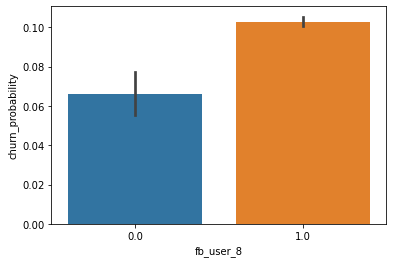

In [171]:
sns.barplot(x='fb_user_8',y='churn_probability',data=df)
#fb_user will churn in August

<AxesSubplot:xlabel='night_pck_user_7', ylabel='churn_probability'>

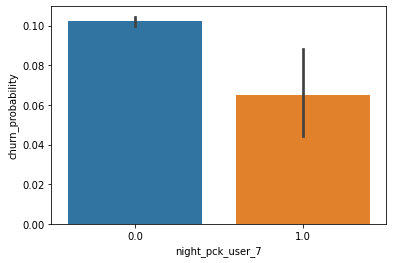

In [172]:
sns.barplot(x='night_pck_user_7',y='churn_probability',data=df)
#user with night pack are not more likely to churn in july

<AxesSubplot:xlabel='night_pck_user_8', ylabel='churn_probability'>

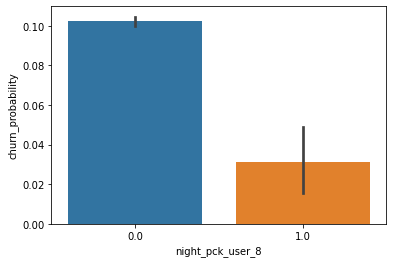

In [173]:
sns.barplot(x='night_pck_user_8',y='churn_probability',data=df)
#user with night pack arenot more likely to churn in August

<AxesSubplot:xlabel='last_day_rch_amt_6', ylabel='churn_probability'>

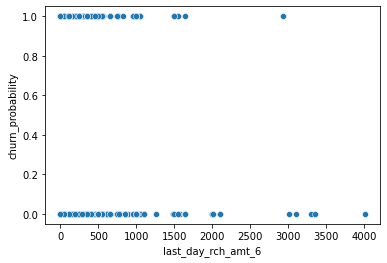

In [174]:
sns.scatterplot(x='last_day_rch_amt_6',y='churn_probability',data=df)

<AxesSubplot:xlabel='sachet_2g_6', ylabel='churn_probability'>

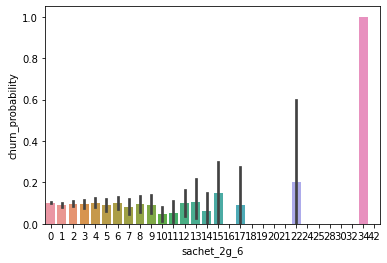

In [175]:




sns.barplot(x='sachet_2g_6',y='churn_probability',data=df)

<AxesSubplot:xlabel='sachet_2g_7', ylabel='churn_probability'>

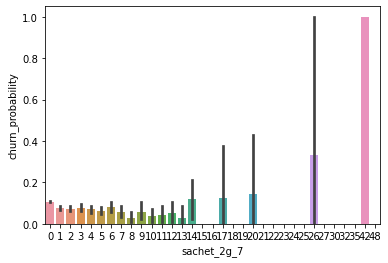

In [176]:
sns.barplot(x='sachet_2g_7',y='churn_probability',data=df)

<AxesSubplot:xlabel='sachet_3g_8', ylabel='churn_probability'>

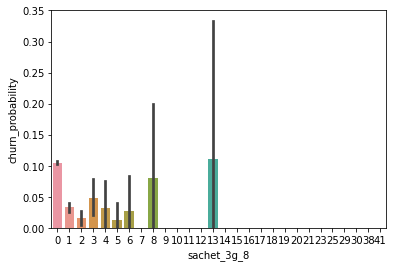

In [177]:
sns.barplot(x='sachet_3g_8',y='churn_probability',data=df)

<AxesSubplot:xlabel='sachet_3g_6', ylabel='churn_probability'>

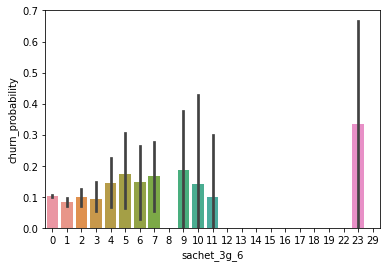

In [178]:
sns.barplot(x='sachet_3g_6',y='churn_probability',data=df)

<AxesSubplot:xlabel='sachet_3g_7', ylabel='churn_probability'>

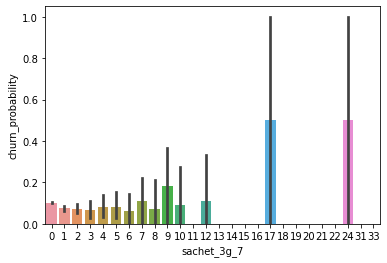

In [179]:
sns.barplot(x='sachet_3g_7',y='churn_probability',data=df)

<AxesSubplot:xlabel='sachet_3g_8', ylabel='churn_probability'>

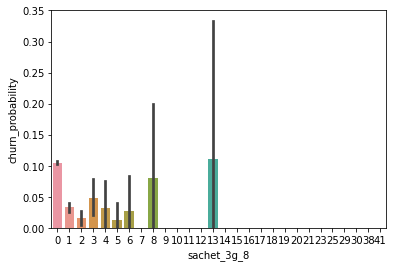

In [180]:
sns.barplot(x='sachet_3g_8',y='churn_probability',data=df)

<AxesSubplot:xlabel='vol_2g_mb_6', ylabel='churn_probability'>

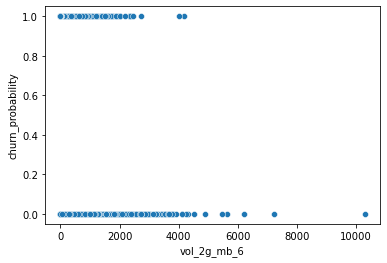

In [181]:
sns.scatterplot(x='vol_2g_mb_6',y='churn_probability',data=df)#no trend

In [182]:
df.columns

Index(['id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_6',
       'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       ...
       'fb_user_7', 'fb_user_8', 'aon', 'aug_vbc_3g', 'jul_vbc_3g',
       'jun_vbc_3g', 'churn_probability', 'day_of_6th_month',
       'day_of_7th_month', 'day_of_8th_month'],
      dtype='object', length=165)

In [183]:
df['avg_rech_amt_6_7'] = (df['total_rech_amt_6'] + df['total_rech_amt_7'])/2#derived variables

In [184]:
X = df['avg_rech_amt_6_7'].quantile(0.7)
X

370.0

In [185]:
df = df[df['avg_rech_amt_6_7'] >= X]
df.head()

,id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,day_of_6th_month,day_of_7th_month,day_of_8th_month,avg_rech_amt_6_7
12,12,0.0,0.0,0.0,439.919,397.946,392.024,244.46,108.31,42.98,571.98,727.91,644.43,0.0,0.0,0.0,0.0,0.0,0.0,0.00,7.86,3.98,44.01,13.93,51.24,0.00,0.00,0.00,0.0,0.0,0.00,44.01,21.79,55.23,244.46,100.44,38.99,527.96,713.98,593.18,0.0,0.0,0.00,0.0,0.0,0.0,772.43,814.43,632.18,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,816.44,836.23,687.41,0.00,0.53,1.06,26.93,25.68,23.46,0.00,0.00,0.00,26.93,26.21,24.53,0.23,0.00,0.00,7.33,8.64,2.46,0.00,0.48,0.0,0.0,0.0,0.0,7.56,9.13,2.46,34.49,35.34,26.99,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,15,10,20,521,418,365,110,110,50,110,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,90.069931,89.115767,90.618564,86.8639,85.846074,86.348404,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,1.0,1.0,322,0.0,0.0,0.0,0,29.0,30.0,30.0,469.5
15,15,0.0,0.0,0.0,580.549,377.294,338.286,10.43,24.99,194.43,317.11,341.79,197.09,0.0,0.0,0.0,0.0,0.0,0.0,10.43,24.99,194.43,313.76,330.88,185.88,3.26,10.91,4.94,0.0,0.0,0.00,327.46,366.79,385.26,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,6.26,0.0,0.0,0.0,0.00,0.00,6.26,0.0,0.0,0.0,0.08,0.00,0.00,0.1,0.0,0.0,327.64,366.79,391.53,13.86,20.18,335.43,219.31,754.24,285.63,0.00,1.93,8.88,233.18,776.36,629.94,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.03,0.0,0.0,0.0,0.0,0.00,1.03,0.00,233.18,777.39,629.94,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,5,3,4,654,400,652,250,250,250,0,150,250,1.0,0.0,1.0,154.0,0.0,154.0,1.0,0.0,1.0,0.0,0.0,0.0,154.0,0.0,154.0,260.42,0.0,354.35,0.0,0.0,0.0,0.000000,89.115767,0.000000,164.7500,85.846074,28.800000,0.0,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,1.0,1.0,1.0,602,0.0,0

In [186]:
df.drop(['day_of_6th_month','day_of_7th_month','day_of_8th_month'],axis=1,inplace=True)

In [187]:

df.columns

Index(['id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_6',
       'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       ...
       'sachet_3g_8', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'aon',
       'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'churn_probability',
       'avg_rech_amt_6_7'],
      dtype='object', length=163)

In [188]:
df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 21018 entries, 12 to 69996
Columns: 163 entries, id to avg_rech_amt_6_7
dtypes: float64(136), int64(27)
memory usage: 26.3 MB


<AxesSubplot:xlabel='max_rech_amt_6', ylabel='churn_probability'>

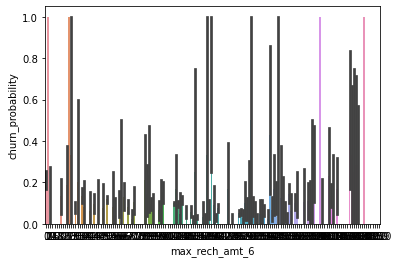

In [189]:

sns.barplot(x='max_rech_amt_6',y='churn_probability',data=df)
#there is a fluctuation in max_recharge amt for june

<AxesSubplot:xlabel='max_rech_amt_7', ylabel='churn_probability'>

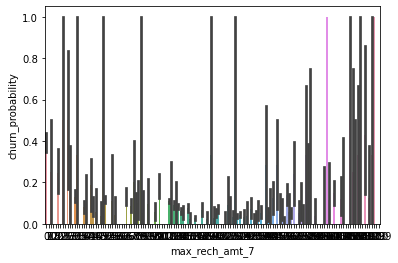

In [190]:
sns.barplot(x='max_rech_amt_7',y='churn_probability',data=df)
# same thing for july

<AxesSubplot:xlabel='max_rech_amt_8', ylabel='churn_probability'>

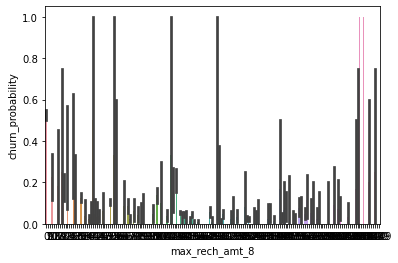

In [191]:
sns.barplot(x='max_rech_amt_8',y='churn_probability',data=df)

In [192]:

# List only the numeric columns
numeric_cols = df.select_dtypes(exclude=['object']).columns
print(numeric_cols)

Index(['id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_6',
       'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       ...
       'sachet_3g_8', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'aon',
       'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'churn_probability',
       'avg_rech_amt_6_7'],
      dtype='object', length=163)




## Outlier handling

In [193]:
#Removing outliers below 10th and above 90th percentile
for col in numeric_cols: 
    q1 = df[col].quantile(0.10)
    q3 = df[col].quantile(0.90)
    iqr = q3-q1
    range_low  = q1-1.5*iqr
    range_high = q3+1.5*iqr
    # Assigning the filtered dataset into data
    data = df.loc[(df[col] > range_low) & (df[col] < range_high)]

data.shape

(20803, 163)

## Deriving New Variables

In [194]:
#This column indicates whether the minutes of usage of the customer has decreased in the action phase than the good phase.

# Total mou at good phase incoming and outgoing
data['total_mou_good'] = (data['total_og_mou_6'] + data['total_ic_mou_6'])

In [195]:
# Avg. mou at action phase
# We are taking average because there are two months(7 and 6) in action phase
data['avg_mou_action'] = (data['total_og_mou_7'] + data['total_og_mou_6'] + data['total_ic_mou_7'] + data['total_ic_mou_6'])/2# Avg. mou at action phase
# Wfta['avg_mou_action'] = (data['total_og_mou_7'] + data['total_og_mou_6'] + data['total_ic__7'] + data['total_ic_mou_6'])/2

In [196]:
# Difference avg_mou_good and avg_mou_action
data['diff_mou'] = data['avg_mou_action'] - data['total_mou_good']

In [197]:
# Checking whether the mou has decreased in action phase
data['decrease_mou_action'] = np.where((data['diff_mou'] < 0), 1, 0)

In [198]:
#This column indicates whether the number of recharge of the customer has decreased in the action phase than the good phase.

# Avg rech number at action phase
data['avg_rech_num_action'] = (data['total_rech_num_7'] + data['total_rech_num_6'])/2

In [199]:
# Difference total_rech_num_6 and avg_rech_action
data['diff_rech_num'] = data['avg_rech_num_action'] - data['total_rech_num_6']

In [200]:
# Checking if rech_num has decreased in action phase
data['decrease_rech_num_action'] = np.where((data['diff_rech_num'] < 0), 1, 0)

In [201]:
#This column indicates whether the amount of recharge of the customer has decreased in the action phase than the good phase.

# Avg rech_amt in action phase
data['avg_rech_amt_action'] = (data['total_rech_amt_7'] + data['total_rech_amt_6'])/2

In [202]:
# Difference of action phase rech amt and good phase rech amt
data['diff_rech_amt'] = data['avg_rech_amt_action'] - data['total_rech_amt_6']

In [203]:
# Checking if rech_amt has decreased in action phase
data['decrease_rech_amt_action'] = np.where((data['diff_rech_amt'] < 0), 1, 0) 

In [204]:
# Checking if rech_amt has decreased in action phase
data['decrease_rech_amt_action'] = np.where((data['diff_rech_amt'] < 0), 1, 0) 

In [205]:
# ARUP in action phase
data['avg_arpu_action'] = (data['arpu_7'] + data['arpu_6'])/2

In [206]:
# Difference of good and action phase ARPU
data['diff_arpu'] = data['avg_arpu_action'] - data['arpu_6']

In [207]:
# Checking whether the arpu has decreased on the action month
data['decrease_arpu_action'] = np.where(data['diff_arpu'] < 0, 1, 0)

In [208]:
#This column indicates whether the volume based cost of the customer has decreased in the action phase than the good phase.

# VBC in action phase
data['avg_vbc_3g_action'] = (data['jul_vbc_3g'] + data['aug_vbc_3g'])/2

In [209]:
# Difference of good and action phase VBC
data['diff_vbc'] = data['avg_vbc_3g_action'] - data['jun_vbc_3g']

In [210]:
# Checking whether the VBC has decreased on the action month
data['decrease_vbc_action'] = np.where(data['diff_vbc'] < 0 , 1, 0)

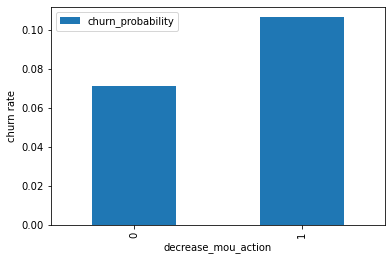

In [211]:
#Univariate analysis
#Churn rate on the basis whether the customer decreased her/his MOU in action month

data.pivot_table(values='churn_probability', index='decrease_mou_action', aggfunc='mean').plot.bar()
plt.ylabel('churn rate')
plt.show()
#We can see that the churn rate is more for the customers, whose minutes of usage(mou) decreased in the action phase than the good phase.



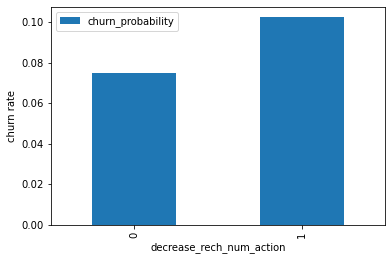

In [212]:
#Churn rate on the basis whether the customer decreased her/his number of recharge in action mont
data.pivot_table(values='churn_probability', index='decrease_rech_num_action', aggfunc='mean').plot.bar()
plt.ylabel('churn rate')
plt.show()
#As expected, the churn rate is more for the customers, whose number of recharge less.

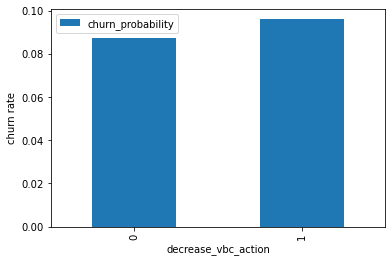

In [213]:
#Churn rate on the basis whether the customer decreased her/his amount of recharge in action month
data.pivot_table(values='churn_probability', index='decrease_vbc_action', aggfunc='mean').plot.bar()
plt.ylabel('churn rate')
plt.show()
#Here we see the expected result. The churn rate is less for the customers, whose volume based cost in action month is increased. That means the customers  do the monthly recharge more when they are in the action phase.

In [214]:
#Analysis of the average revenue per customer (churn and not churn) in the action phase
# Creating churn dataframe
data_churn = data[data['churn_probability'] == 1]
# Creating not churn dataframe
data_non_churn = data[data['churn_probability'] == 0]

[Text(0.5, 0, 'Action phase ARPU')]

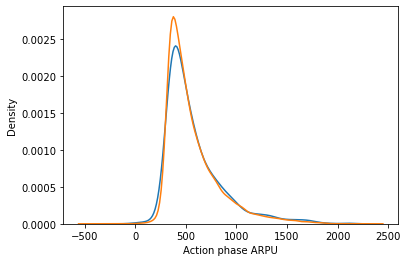

In [215]:
# Distribution plot
ax = sns.distplot(data_churn['avg_arpu_action'],label='churn',hist=False)
ax = sns.distplot(data_non_churn['avg_arpu_action'],label='not churn',hist=False)
ax.set(xlabel='Action phase ARPU')

#Average revenue per user (ARPU) for the churned customers is mostly densed on the 0 to 1000. The higher ARPU customers are less likely to be churned.

#ARPU for the not churned customers is mostly densed on the 0 to 400.

[Text(0.5, 0, 'Action phase MOU')]

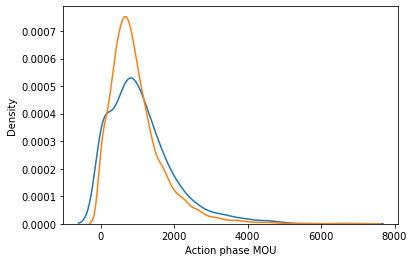

In [216]:
#Analysis of the minutes of usage MOU (churn and not churn) in the action phase
# Distribution plot
ax = sns.distplot(data_churn['total_mou_good'],label='churn',hist=False)
ax = sns.distplot(data_non_churn['total_mou_good'],label='non churn',hist=False)
ax.set(xlabel='Action phase MOU')

#Minutes of usage(MOU) of the churn customers is mostly populated on the 0 to 2000 range. Higher the MOU, lesser the churn probability.

## Bivariate analysis

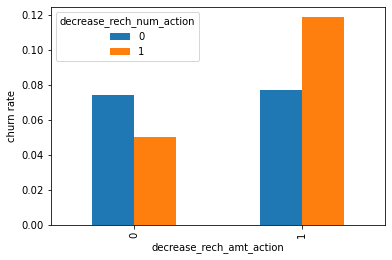

In [217]:

#Analysis of churn rate by the decreasing recharge amount and number of recharge in the action phase.

data.pivot_table(values='churn_probability', index='decrease_rech_amt_action', columns='decrease_rech_num_action', aggfunc='mean').plot.bar()
plt.ylabel('churn rate')
plt.show()

#We can see from the above plot, that the churn rate is more for the customers, whose recharge amount as well as number of recharge have decreased in the action phase than the good phase.

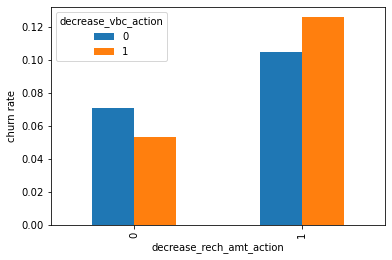

In [218]:
#Analysis of churn rate by the decreasing recharge amount and volume based cost in the action phase
data.pivot_table(values='churn_probability', index='decrease_rech_amt_action', columns='decrease_vbc_action', aggfunc='mean').plot.bar()
plt.ylabel('churn rate')
plt.show()


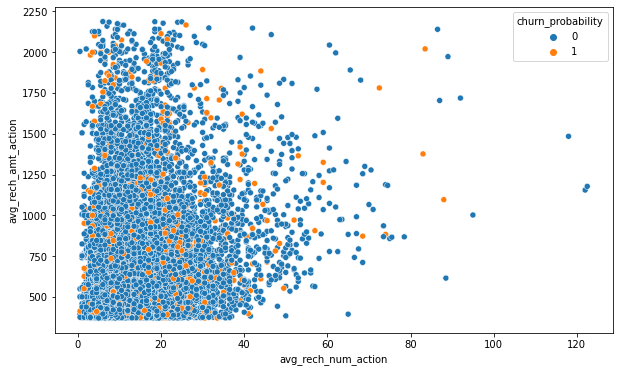

In [219]:
#Analysis of recharge amount and number of recharge in action month
plt.figure(figsize=(10,6))
ax = sns.scatterplot('avg_rech_num_action','avg_rech_amt_action', hue='churn_probability', data=data)

In [220]:


df.isna().sum()/len(df)*100

id                    0.0
loc_og_t2o_mou        0.0
std_og_t2o_mou        0.0
loc_ic_t2o_mou        0.0
arpu_6                0.0
arpu_7                0.0
arpu_8                0.0
onnet_mou_6           0.0
onnet_mou_7           0.0
onnet_mou_8           0.0
offnet_mou_6          0.0
offnet_mou_7          0.0
offnet_mou_8          0.0
roam_ic_mou_6         0.0
roam_ic_mou_7         0.0
roam_ic_mou_8         0.0
roam_og_mou_6         0.0
roam_og_mou_7         0.0
roam_og_mou_8         0.0
loc_og_t2t_mou_6      0.0
loc_og_t2t_mou_7      0.0
loc_og_t2t_mou_8      0.0
loc_og_t2m_mou_6      0.0
loc_og_t2m_mou_7      0.0
loc_og_t2m_mou_8      0.0
loc_og_t2f_mou_6      0.0
loc_og_t2f_mou_7      0.0
loc_og_t2f_mou_8      0.0
loc_og_t2c_mou_6      0.0
loc_og_t2c_mou_7      0.0
loc_og_t2c_mou_8      0.0
loc_og_mou_6          0.0
loc_og_mou_7          0.0
loc_og_mou_8          0.0
std_og_t2t_mou_6      0.0
std_og_t2t_mou_7      0.0
std_og_t2t_mou_8      0.0
std_og_t2m_mou_6      0.0
std_og_t2m_m

## Dropping Derived Variables as they were only needed for EDA

In [221]:
data = data.drop(['total_mou_good','avg_mou_action','diff_mou','avg_rech_num_action','diff_rech_num','avg_rech_amt_action',
                 'diff_rech_amt','avg_arpu_action','diff_arpu','avg_vbc_3g_action','diff_vbc'], axis=1)

In [222]:
data=data.drop(['decrease_mou_action','decrease_rech_num_action','decrease_rech_amt_action','decrease_arpu_action','decrease_vbc_action','avg_rech_amt_6_7'],axis=1)

## ModelBulding 

In [223]:
X=data.drop(['churn_probability','id'],axis=1)

In [224]:
X.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
12,0.0,0.0,0.0,439.919,397.946,392.024,244.46,108.31,42.98,571.98,727.91,644.43,0.0,0.0,0.0,0.0,0.0,0.0,0.00,7.86,3.98,44.01,13.93,51.24,0.00,0.00,0.00,0.0,0.0,0.00,44.01,21.79,55.23,244.46,100.44,38.99,527.96,713.98,593.18,0.0,0.0,0.00,0.0,0.0,0.0,772.43,814.43,632.18,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,816.44,836.23,687.41,0.00,0.53,1.06,26.93,25.68,23.46,0.00,0.00,0.00,26.93,26.21,24.53,0.23,0.00,0.00,7.33,8.64,2.46,0.00,0.48,0.0,0.0,0.0,0.0,7.56,9.13,2.46,34.49,35.34,26.99,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,15,10,20,521,418,365,110,110,50,110,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,90.069931,89.115767,90.618564,86.8639,85.846074,86.348404,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,1.0,1.0,322,0.0,0.0,0.0
15,0.0,0.0,0.0,580.549,377.294,338.286,10.43,24.99,194.43,317.11,341.79,197.09,0.0,0.0,0.0,0.0,0.0,0.0,10.43,24.99,194.43,313.76,330.88,185.88,3.26,10.91,4.94,0.0,0.0,0.00,327.46,366.79,385.26,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,6.26,0.0,0.0,0.0,0.00,0.00,6.26,0.0,0.0,0.0,0.08,0.00,0.00,0.1,0.0,0.0,327.64,366.79,391.53,13.86,20.18,335.43,219.31,754.24,285.63,0.00,1.93,8.88,233.18,776.36,629.94,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.03,0.0,0.0,0.0,0.0,0.00,1.03,0.00,233.18,777.39,629.94,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,5,3,4,654,400,652,250,250,250,0,150,250,1.0,0.0,1.0,154.0,0.0,154.0,1.0,0.0,1.0,0.0,0.0,0.0,154.0,0.0,154.0,260.42,0.0,354.35,0.0,0.0,0.0,0.000000,89.115767,0.000000,164.7500,85.846074,28.800000,0.0,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,1.0,1.0,1.0,602,0.0,0.0,0.0
23,0.0,0.0,0.0,1130.948,905.506,479.762,859.53,372.71,0.89,293.46,450.11,386.91,0.0,0.0,0.0,0.0,0.0,0.0,859.53,

In [225]:
from sklearn.model_selection import train_test_split


# Putting response variable to y
y = data['churn_probability']

y.head()

12    0
15    0
23    0
24    0
25    0
Name: churn_probability, dtype: int64

In [226]:

X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

## Balancing dataset

In [227]:
# class count
class_count_0, class_count_1 = data['churn_probability'].value_counts()

# Separate class
churn_0 = data[data['churn_probability'] == 0]
churn_1 = data[data['churn_probability'] == 1]# print the shape of the class
print('class 0:', churn_0.shape)
print('class 1:', churn_1.shape)

class 0: (18968, 162)
class 1: (1835, 162)


total class of 1 and0: 0    1835
1    1835
Name: churn_probability, dtype: int64


<AxesSubplot:title={'center':'count (target)'}>

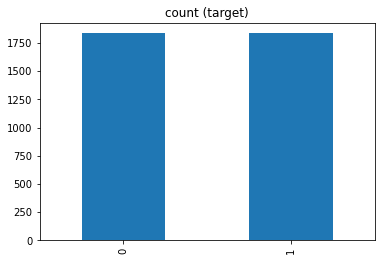

In [228]:
churn_0_under = churn_0.sample(class_count_1)

data= pd.concat([churn_0_under, churn_1], axis=0)

print("total class of 1 and0:",data['churn_probability'].value_counts())# plot the count after under-sampeling
data['churn_probability'].value_counts().plot(kind='bar', title='count (target)')

In [537]:


num_cols = [col for col in X_train.columns if col not in ['id', 'churn_probability']]
scaler = StandardScaler()
X_train[num_cols] = scaler.fit_transform(X_train[num_cols])
# List of the numeric columns


In [230]:
X_train.shape

(14562, 160)

## PCA

In [231]:
from sklearn.decomposition import PCA

In [232]:
pca = PCA(random_state=42)

In [233]:
pca.fit(X_train)

PCA(random_state=42)

In [234]:
pca.components_# Principal Components 

array([[ 6.89154973e-19, -0.00000000e+00,  3.33066907e-16, ...,
         1.47389153e-01,  1.55470061e-01,  1.43768129e-01],
       [-1.08235419e-18, -1.11022302e-16,  1.66533454e-16, ...,
        -2.90346277e-03, -1.19391080e-02, -1.65838221e-02],
       [-2.46717159e-19, -9.71445147e-17,  3.81639165e-17, ...,
         3.26149423e-02,  3.27891191e-02,  2.57215175e-02],
       ...,
       [ 0.00000000e+00,  6.39983295e-02,  2.49111830e-01, ...,
         9.54097912e-17, -5.89805982e-17,  2.08166817e-17],
       [ 9.99999339e-01,  5.57576802e-04, -3.42618142e-04, ...,
         2.84603070e-18, -7.02020907e-18,  1.71439469e-18],
       [ 0.00000000e+00,  1.49002107e-01, -6.02283621e-01, ...,
        -6.93889390e-17,  1.52655666e-16, -1.38777878e-16]])

In [235]:
pca.explained_variance_ratio_

array([1.04014966e-01, 7.84289616e-02, 6.84205703e-02, 5.38033658e-02,
       4.03807285e-02, 3.19570326e-02, 2.94917890e-02, 2.53115388e-02,
       2.36589252e-02, 2.24189823e-02, 2.09678431e-02, 1.92156513e-02,
       1.89208238e-02, 1.74932480e-02, 1.69881465e-02, 1.63425081e-02,
       1.60243736e-02, 1.47431968e-02, 1.42074926e-02, 1.36515343e-02,
       1.27125772e-02, 1.25609158e-02, 1.18608661e-02, 1.15845483e-02,
       1.06524759e-02, 1.05424442e-02, 1.03346575e-02, 9.80452334e-03,
       8.95613188e-03, 8.84210418e-03, 8.60745984e-03, 8.45511388e-03,
       8.26003727e-03, 7.45053393e-03, 6.78869951e-03, 6.62532967e-03,
       6.41710357e-03, 6.31741035e-03, 6.20670007e-03, 5.82097149e-03,
       5.76031655e-03, 5.56492274e-03, 5.37635370e-03, 5.18972809e-03,
       5.08978281e-03, 4.99690560e-03, 4.86340054e-03, 4.72752567e-03,
       4.58296283e-03, 4.50075317e-03, 4.27872581e-03, 4.12641767e-03,
       3.84057357e-03, 3.71374007e-03, 3.50860242e-03, 3.43794135e-03,
      

In [236]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)

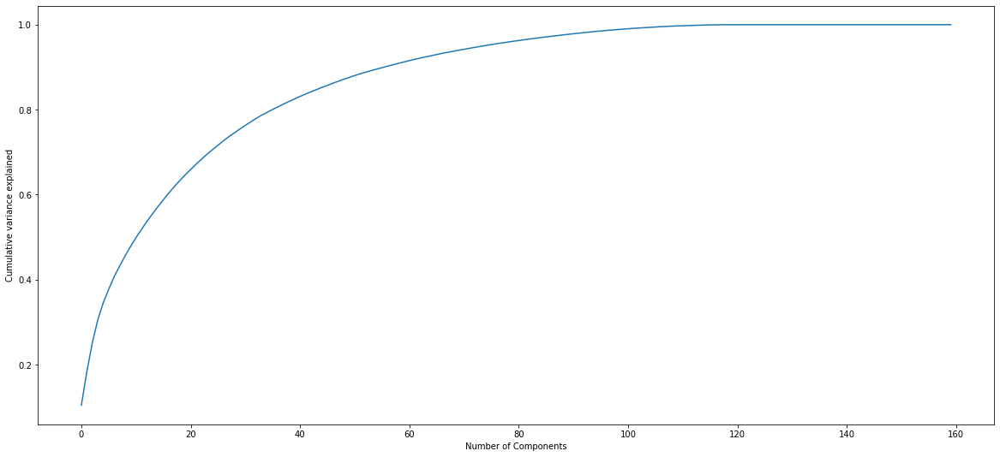

In [237]:
fig = plt.figure(figsize=[20,9])
#plt.vlines(x=20, ymax=1, ymin=0, colors="r", linestyles="--")
#plt.hlines(y=0.95, xmax=30, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.xlabel('Number of Components')
plt.ylabel("Cumulative variance explained")
plt.show()
#90% variance is explainedby 60 features so we can move forward with 60 features

In [238]:
from sklearn.decomposition import IncrementalPCA
#incremental PCA will build only 60cols

In [239]:
pca_final = IncrementalPCA(n_components=60)

In [240]:
df_train_pca = pca_final.fit_transform(X_train)

In [241]:



df_train_pca.shape

(14562, 60)

In [242]:
df_train_pca

array([[ 4.29986821e+00, -5.09233210e+00, -1.01243592e+00, ...,
        -2.85891448e-01, -2.33547053e-01, -8.93609718e-02],
       [-1.93561972e+00, -3.23683553e-01,  2.04620966e-01, ...,
         1.17641332e-01, -5.12604115e-01, -2.27301035e-01],
       [-7.32024819e-01,  1.46677148e+00, -1.60809084e+00, ...,
        -5.26208734e-01,  6.06938238e-01, -3.63991220e-02],
       ...,
       [ 2.80511469e-01,  4.89653708e+00, -1.20959496e+00, ...,
        -2.47139903e-01,  4.05586210e-01,  1.99384149e-01],
       [ 3.64912070e-01, -4.76314622e+00,  5.66304863e-01, ...,
         6.80300849e-01, -1.10132864e+00,  9.10656910e-01],
       [-3.04585895e+00, -2.83911331e+00,  1.07019655e+00, ...,
        -2.24099460e-02, -2.72327723e-01,  1.08203921e-03]])

In [243]:


corrmat = np.corrcoef(df_train_pca.transpose())

In [244]:
corrmat.shape

(60, 60)

<AxesSubplot:>

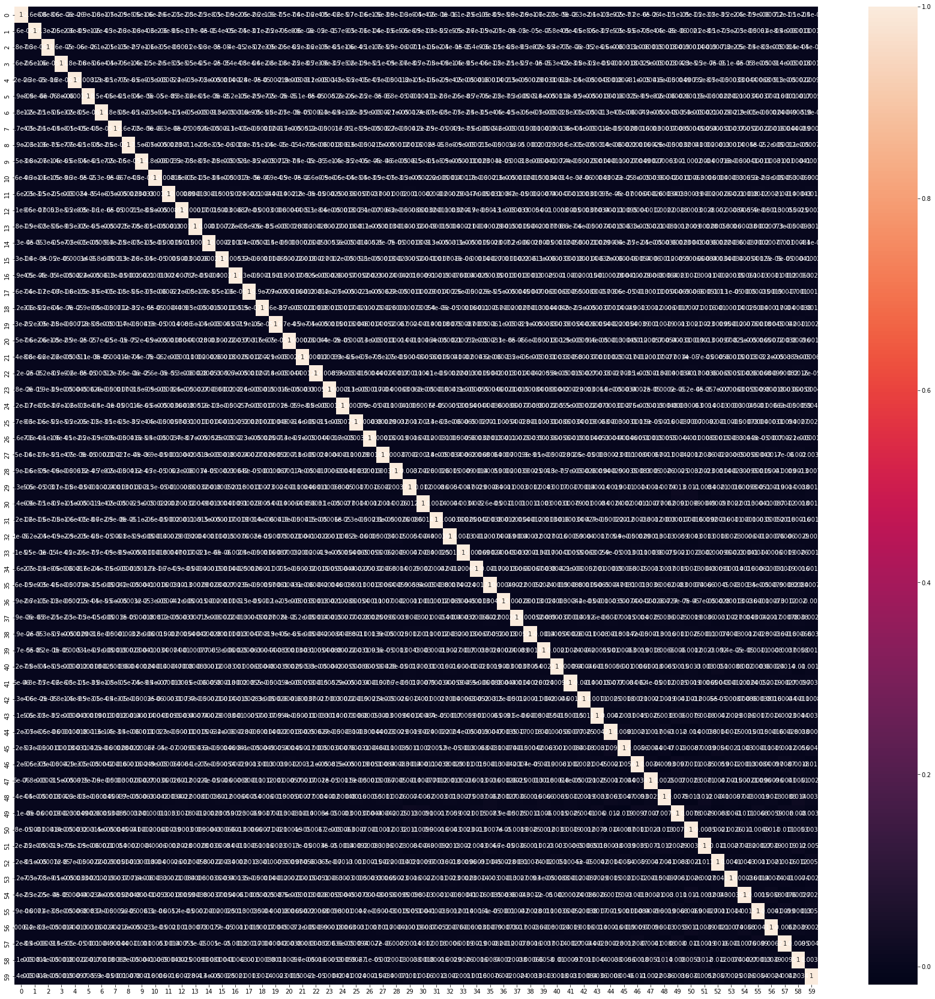

In [245]:
plt.figure(figsize=[30,30])
sns.heatmap(corrmat, annot=True)

## PCA with Logistic Regression

In [246]:
from sklearn.linear_model import LogisticRegression

In [247]:


learner_pca = LogisticRegression()

In [248]:
model_pca = learner_pca.fit(df_train_pca, y_train)

In [249]:
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(6241, 60)

In [250]:

pred_probs_test = model_pca.predict_proba(df_test_pca)

In [251]:
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test[:,1]))# we got descent roc _auc_score ie 84%

'0.84'

In [252]:
## Manually given the variance to be explained value ie 90%

In [253]:
pca_again = PCA(0.9)#0.9 amount of variance to cpture

In [254]:
df_train_pca2 = pca_again.fit_transform(X_train)

In [255]:
df_train_pca2.shape

(14562, 57)

In [256]:
learner_pca2 = LogisticRegression()

In [257]:
model_pca2 = learner_pca2.fit(df_train_pca2, y_train)

In [258]:
df_test_pca2 = pca_again.transform(X_test)

In [259]:
df_test_pca2.shape

(6241, 57)

In [260]:
pred_probs_test2 = model_pca2.predict_proba(df_test_pca2)[:,1]

In [261]:
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test2))# got 84 % roc_auc_score

'0.84'

## DecisionTree with PCA

In [262]:
learner_pca = DecisionTreeClassifier()

In [263]:

model_pca = learner_pca.fit(df_train_pca, y_train)

In [264]:

df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(6241, 60)

In [265]:
pred_probs_test = model_pca.predict_proba(df_test_pca)

In [266]:
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test[:,1]))# we got less roc_auc_score ie 55% this is may be due to reduction in features

'0.52'

## RandomForest Classifier with PCA

In [267]:
learner_pca = RandomForestClassifier()

In [268]:

model_pca = learner_pca.fit(df_train_pca, y_train)

In [269]:
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(6241, 60)

In [270]:
pred_probs_test = model_pca.predict_proba(df_test_pca)

In [271]:
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test[:,1]))# we got less roc_auc_score ie 55% this is may be due to reduction in features

'0.55'



## Without PCA Logistic Regression

In [272]:
#Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()



<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                14562
Model:                            GLM   Df Residuals:                    14419
Model Family:                Binomial   Df Model:                          142
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Wed, 03 May 2023   Deviance:                   1.0988e+05
Time:                        18:03:18   Pearson chi2:                 5.37e+18
No. Iterations:                   100   Pseudo R-squ. (CS):                nan
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const              -1.264e+15   5.56e+05  -2.27e+09      0.000   -1.26e+15   -1.26e+15
loc_og_t2o_mou      2.802e+07      1.879   1.49e+07      0.000     2.8e+07     2.8e+07
std_og_t2o_mou      9.867e+07      1.542    6.4e+07      0.000    9.87e+07    9.87e+07
loc_ic_t2o_mou      6.538e+07      1.586   4.12e+07      0.000    6.54e+07    6.54e+07
arpu_6             -1.854e+13   1.78e+06  -1.04e+07      0.000   -1.85e+13   -1.85e+13
arpu_7              1.138e+14   1.92e+06   5.94e+07      0.000    1.14e+14    1.14e+14
arpu_8               3.06e+14    2.2e+06   1.39e+08      0.000    3.06e+14    3.06e+14
onnet_mou_6         3.856e+15   6.96e+07   5.54e+07      0.000    3.86e+15    3.86e+15
onnet_mou_7        -1.468e+15   4.92e+07  -2.98e+07      0.000   -1.47e+15   -1.47e+15
onnet_mou_8        -2.042e+15   3.44e+07  -5.94e+07      0.000   -2.04e+15   -2.04e+15
offnet_mou_6        4.038e+15   6.76e+07   5.97e+07      0.000    4.04e+15    4.04e+15
offnet_mou_7       -1.446e+15   4.54e+07  -3.19e+07      0.000   -1.45e+15   -1.45e+15
offnet_mou_8       -1.842e+15   3.19e+07  -5.78e+07      0.000   -1.84e+15   -1.84e+15
roam_ic_mou_6       1.508e+13   8.09e+05   1.86e+07      0.000    1.51e+13    1.51e+13
roam_ic_mou_7        2.88e+13   8.39e+05   3.44e+07      0.000    2.88e+13    2.88e+13
roam_ic_mou_8       5.777e+12   7.85e+05   7.36e+06      0.000    5.78e+12    5.78e+12
roam_og_mou_6      -9.555e+14   1.68e+07   -5.7e+07      0.000   -9.56e+14   -9.55e+14
roam_og_mou_7       2.999e+14   8.92e+06   3.36e+07      0.000       3e+14       3e+14
roam_og_mou_8       4.015e+14   7.15e+06   5.61e+07      0.000    4.01e+14    4.01e+14
loc_og_t2t_mou_6   -1.234e+18   2.32e+10  -5.32e+07      0.000   -1.23e+18   -1.23e+18
loc_og_t2t_mou_7    4.271e+17   2.49e+10   1.71e+07      0.000    4.27e+17    4.27e+17
loc_og_t2t_mou_8    2.183e+17    2.3e+10   9.48e+06      0.000    2.18e+17    2.18e+17
loc_og_t2m_mou_6   -1.198e+18   2.25e+10  -5.32e+07      0.000    -1.2e+18    -1.2e+18
loc_og_t2m_mou_7    3.706e+17   2.16e+10   1.71e+07      0.000    3.71e+17    3.71e+17
loc_og_t2m_mou_8    2.014e+17   2.13e+10   9.47e+06      0.000    2.01e+17    2.01e+17
loc_og_t2f_mou_6   -1.069e+17   2.01e+09  -5.32e+07      0.000   -1.07e+17   -1.07e+17
loc_og_t2f_mou_7    3.407e+16   1.99e+09   1.72e+07      0.000    3.41e+16    3.41e+16
loc_og_t2f_mou_8    1.853e+16   1.96e+09   9.44e+06      0.000    1.85e+16    1.85e+16
loc_og_t2c_mou_6   -6.608e+12   7.29e+05  -9.06e+06      0.000   -6.61e+12   -6.61e+12
loc_og_t2c_mou_7    1.489e+13   8.43e+05   1.77e+07      0.000    1.49e+13    1.49e+13
loc_og_t2c_mou_8    1.408e+13   6.89e+05   2.04e+07      0.000    1.41e+13    1.41e+13
loc_og_mou_6        2.367e+18   4.08e+10    5.8e+07      0.000    2.37e+18    2.37e+18
loc_og_mou_7       -6.728e+17   3.87e+

## Using RFE

In [273]:
from sklearn.feature_selection import RFE
lm=LogisticRegression()
lm.fit(X_train,y_train)

rfe=RFE(lm,n_features_to_select=100)# running RFE
rfe= rfe.fit(X_train,y_train)

In [274]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('loc_og_t2o_mou', False, 61),
 ('std_og_t2o_mou', False, 60),
 ('loc_ic_t2o_mou', False, 59),
 ('arpu_6', False, 39),
 ('arpu_7', True, 1),
 ('arpu_8', True, 1),
 ('onnet_mou_6', False, 37),
 ('onnet_mou_7', True, 1),
 ('onnet_mou_8', True, 1),
 ('offnet_mou_6', True, 1),
 ('offnet_mou_7', True, 1),
 ('offnet_mou_8', True, 1),
 ('roam_ic_mou_6', False, 28),
 ('roam_ic_mou_7', True, 1),
 ('roam_ic_mou_8', False, 19),
 ('roam_og_mou_6', False, 45),
 ('roam_og_mou_7', False, 8),
 ('roam_og_mou_8', False, 44),
 ('loc_og_t2t_mou_6', True, 1),
 ('loc_og_t2t_mou_7', True, 1),
 ('loc_og_t2t_mou_8', True, 1),
 ('loc_og_t2m_mou_6', True, 1),
 ('loc_og_t2m_mou_7', False, 7),
 ('loc_og_t2m_mou_8', True, 1),
 ('loc_og_t2f_mou_6', False, 6),
 ('loc_og_t2f_mou_7', False, 25),
 ('loc_og_t2f_mou_8', True, 1),
 ('loc_og_t2c_mou_6', False, 49),
 ('loc_og_t2c_mou_7', False, 33),
 ('loc_og_t2c_mou_8', False, 14),
 ('loc_og_mou_6', False, 24),
 ('loc_og_mou_7', True, 1),
 ('loc_og_mou_8', True, 1),
 ('std

In [275]:

# Subset the features selected by rfe1
cols_supported = X_train.columns[rfe.support_]

# Subsetting training data for 15 selected columns
X_train_rfe = X_train[cols_supported]

# Add a constant to the model
X_train_rfe = sm.add_constant(X_train_rfe)

In [276]:
 #Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train_rfe)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                14562
Model:                            GLM   Df Residuals:                    14463
Model Family:                Binomial   Df Model:                           98
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2510.3
Date:                Wed, 03 May 2023   Deviance:                       5020.7
Time:                        18:04:46   Pearson chi2:                 7.13e+04
No. Iterations:                   100   Pseudo R-squ. (CS):             0.2206
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.1443      0.111    -37.348      0.000      -4.362      -3.927
arpu_7                 0.3496      0.116      3.010      0.003       0.122       0.577
arpu_8                 0.6401      0.151      4.229      0.000       0.343       0.937
onnet_mou_7            0.4620      0.380      1.216      0.224      -0.283       1.207
onnet_mou_8            0.6245      0.279      2.236      0.025       0.077       1.172
offnet_mou_6           0.4022      0.254      1.581      0.114      -0.096       0.901
offnet_mou_7           0.0751      0.332      0.226      0.821      -0.576       0.727
offnet_mou_8           0.2512      0.274      0.917      0.359      -0.286       0.788
roam_ic_mou_7          0.0655      0.035      1.882      0.060      -0.003       0.134
loc_og_t2t_mou_6       0.4039      0.160      2.526      0.012       0.091       0.717
loc_og_t2t_mou_7      -0.4486      0.350     -1.283      0.200      -1.134       0.237
loc_og_t2t_mou_8    4478.5971   1756.694      2.549      0.011    1035.541    7921.653
loc_og_t2m_mou_6      -0.0769      0.080     -0.959      0.338      -0.234       0.080
loc_og_t2m_mou_8    4136.4935   1622.564      2.549      0.011     956.326    7316.661
loc_og_t2f_mou_8     381.8677    149.754      2.550      0.011      88.356     675.380
loc_og_mou_7           0.0029      0.303      0.010      0.992      -0.590       0.596
loc_og_mou_8       -1.148e+04   2847.306     -4.033      0.000   -1.71e+04   -5903.283
std_og_t2t_mou_6       0.3787      0.235      1.611      0.107      -0.082       0.839
std_og_t2t_mou_7      -0.7812      2.079     -0.376      0.707      -4.856       3.293
std_og_t2t_mou_8       2.2214      3.433      0.647      0.518      -4.508       8.951
std_og_t2m_mou_7      -0.3684      2.049     -0.180      0.857      -4.384       3.647
std_og_t2m_mou_8       2.4062      3.381      0.712      0.477      -4.220       9.033
std_og_mou_7           0.6953      3.000      0.232      0.817      -5.184       6.575
std_og_mou_8       -7921.1027   2401.401     -3.299      0.001   -1.26e+04   -3214.443
isd_og_mou_8        -189.4777     57.484     -3.296      0.001    -302.144     -76.812
spl_og_mou_8        -300.4188     91.122     -3.297      0.001    -479.014    -121.824
og_others_7           -1.6037      0.959     -1.672      0.095      -3.484       0.276
og_others_8          -49.5619     14.846     -3.338      0.001     -78.659     -20.465
total_og_mou_6        -0.5306      0.345     -1.536      0.125      -1.208       0.147
total_og_mou_8      8843.2532   2682.425      3.297      0.001    3585.797    1.41e+04
loc_ic_t2t_mou_6       0.0455      0.319      0.143      0.887      -0.580       0.671
loc_ic_t2t_mou_7       0.1411      0.293      0.482      0.630      -0.433       0.715
loc_ic_t2t_mou_8    5661.9960   1077.0

In [277]:
from sklearn.feature_selection import RFE
lm=LogisticRegression()
lm.fit(X_train,y_train)

rfe=RFE(lm,n_features_to_select=70)# running RFE
rfe= rfe.fit(X_train,y_train)

In [278]:

# Subset the features selected by rfe1
cols_supported = X_train.columns[rfe.support_]

# Subsetting training data for 15 selected columns
X_train_rfe2 = X_train[cols_supported]

# Add a constant to the model
X_train_rfe2 = sm.add_constant(X_train_rfe2)

In [279]:
 #Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train_rfe2)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                14562
Model:                            GLM   Df Residuals:                    14492
Model Family:                Binomial   Df Model:                           69
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2531.2
Date:                Wed, 03 May 2023   Deviance:                       5062.5
Time:                        18:06:09   Pearson chi2:                 1.04e+05
No. Iterations:                    34   Pseudo R-squ. (CS):             0.2184
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.1679      0.113    -37.011      0.000      -4.389      -3.947
arpu_7                 0.3155      0.105      3.004      0.003       0.110       0.521
arpu_8                 0.5654      0.144      3.940      0.000       0.284       0.847
onnet_mou_7            0.6631      0.358      1.854      0.064      -0.038       1.364
onnet_mou_8            0.6579      0.278      2.364      0.018       0.112       1.203
offnet_mou_6           0.4195      0.234      1.791      0.073      -0.040       0.879
offnet_mou_7           0.1977      0.069      2.857      0.004       0.062       0.333
offnet_mou_8           0.3006      0.247      1.215      0.224      -0.184       0.786
loc_og_t2t_mou_6       0.3951      0.151      2.619      0.009       0.099       0.691
loc_og_t2t_mou_7      -0.3861      0.275     -1.405      0.160      -0.924       0.152
loc_og_t2t_mou_8       0.1597      0.340      0.470      0.639      -0.507       0.826
loc_og_t2f_mou_8       0.0950      0.060      1.579      0.114      -0.023       0.213
loc_og_mou_7          -0.2183      0.151     -1.444      0.149      -0.515       0.078
loc_og_mou_8          -0.8648      0.789     -1.096      0.273      -2.412       0.682
std_og_t2t_mou_6       0.4142      0.215      1.927      0.054      -0.007       0.836
std_og_t2t_mou_7      -0.4944      0.305     -1.619      0.106      -1.093       0.104
std_og_t2t_mou_8       1.6777      2.944      0.570      0.569      -4.093       7.448
std_og_t2m_mou_8       1.8532      2.891      0.641      0.521      -3.812       7.519
std_og_mou_8          -3.1114      4.510     -0.690      0.490     -11.950       5.727
isd_og_mou_8           0.0415      0.054      0.774      0.439      -0.064       0.146
og_others_7           -1.5266      0.935     -1.632      0.103      -3.360       0.307
og_others_8           -1.9665      3.486     -0.564      0.573      -8.799       4.866
total_og_mou_6        -0.5578      0.316     -1.766      0.077      -1.177       0.061
total_og_mou_8        -0.6062      1.407     -0.431      0.667      -3.363       2.151
loc_ic_t2t_mou_7       0.2398      0.114      2.109      0.035       0.017       0.463
loc_ic_t2t_mou_8    5933.1838   1042.574      5.691      0.000    3889.777    7976.591
loc_ic_t2m_mou_7       0.4154      0.141      2.945      0.003       0.139       0.692
loc_ic_t2m_mou_8    8232.0085   1446.562      5.691      0.000    5396.799    1.11e+04
loc_ic_t2f_mou_8    1763.8829    309.945      5.691      0.000    1156.402    2371.364
loc_ic_mou_6           0.3689      0.485      0.760      0.447      -0.582       1.320
loc_ic_mou_8       -1.162e+04   2042.332     -5.689      0.000   -1.56e+04   -7615.867
std_ic_t2t_mou_7       0.1218      0.065      1.868      0.062      -0.006       0.250
std_ic_t2t_mou_8       0.1727      0.5

In [280]:
from sklearn.feature_selection import RFE
lm=LogisticRegression()
lm.fit(X_train,y_train)

rfe=RFE(lm,n_features_to_select=40)# running RFE
rfe= rfe.fit(X_train,y_train)

In [281]:

# Subset the features selected by rfe1
cols_supported = X_train.columns[rfe.support_]

# Subsetting training data for 15 selected columns
X_train_rfe3 = X_train[cols_supported]

# Add a constant to the model
X_train_rfe3 = sm.add_constant(X_train_rfe3)

In [282]:
 #Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train_rfe3)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                14562
Model:                            GLM   Df Residuals:                    14521
Model Family:                Binomial   Df Model:                           40
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2580.9
Date:                Wed, 03 May 2023   Deviance:                       5161.8
Time:                        18:07:47   Pearson chi2:                 1.13e+05
No. Iterations:                    12   Pseudo R-squ. (CS):             0.2130
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.1566      0.108    -38.489      0.000      -4.368      -3.945
arpu_7                 0.2368      0.053      4.491      0.000       0.133       0.340
arpu_8                 0.3263      0.119      2.745      0.006       0.093       0.559
onnet_mou_7            0.5787      0.338      1.710      0.087      -0.085       1.242
onnet_mou_8            0.7388      0.232      3.185      0.001       0.284       1.194
offnet_mou_6           0.7623      0.184      4.149      0.000       0.402       1.122
offnet_mou_8           0.2719      0.217      1.251      0.211      -0.154       0.698
loc_og_t2t_mou_6       0.5199      0.128      4.056      0.000       0.269       0.771
loc_og_t2t_mou_7      -0.4679      0.219     -2.132      0.033      -0.898      -0.038
loc_og_mou_8          -0.7631      0.685     -1.114      0.265      -2.105       0.579
std_og_t2t_mou_6       0.6796      0.171      3.963      0.000       0.343       1.016
std_og_t2t_mou_7      -0.4572      0.291     -1.570      0.117      -1.028       0.114
std_og_t2t_mou_8       1.8576      3.095      0.600      0.548      -4.208       7.923
std_og_t2m_mou_8       2.2475      3.043      0.739      0.460      -3.716       8.211
std_og_mou_8          -3.3171      4.679     -0.709      0.478     -12.488       5.854
og_others_7           -1.3651      0.884     -1.545      0.122      -3.097       0.367
og_others_8           -1.2185      3.052     -0.399      0.690      -7.200       4.763
total_og_mou_6        -0.8569      0.259     -3.314      0.001      -1.364      -0.350
total_og_mou_8        -0.8896      1.241     -0.717      0.474      -3.323       1.544
loc_ic_t2t_mou_8       0.1946      0.466      0.418      0.676      -0.718       1.108
loc_ic_t2m_mou_8       0.0608      0.644      0.094      0.925      -1.202       1.324
loc_ic_mou_8           3.7916      1.216      3.117      0.002       1.408       6.175
std_ic_t2t_mou_8       0.4089      0.637      0.642      0.521      -0.839       1.657
std_ic_t2m_mou_8       0.7913      0.997      0.793      0.428      -1.164       2.746
std_ic_mou_8           0.8054      1.331      0.605      0.545      -1.803       3.414
total_ic_mou_7         0.6390      0.078      8.213      0.000       0.487       0.792
total_ic_mou_8        -6.7215      1.062     -6.330      0.000      -8.803      -4.640
spl_ic_mou_8          -0.6023      0.112     -5.365      0.000      -0.822      -0.382
isd_ic_mou_8           1.2904      0.215      5.994      0.000       0.869       1.712
total_rech_num_8      -0.2557      0.077     -3.314      0.001      -0.407      -0.104
total_rech_amt_8      -0.5703      0.140     -4.082      0.000      -0.844      -0.296
max_rech_amt_8         0.2849      0.069      4.146      0.000       0.150       0.420
last_day_rch_amt_8    -0.5942      0.0

In [283]:
from sklearn.feature_selection import RFE
lm=LogisticRegression()
lm.fit(X_train,y_train)

rfe=RFE(lm,n_features_to_select=20)# running RFE
rfe= rfe.fit(X_train,y_train)

In [284]:
#t the features selected by rfe1
cols_supported = X_train.columns[rfe.support_]

# Subsetting training data for 15 selected columns
X_train_rfe4 = X_train[cols_supported]

# Add a constant to the model
X_train_rfe4 = sm.add_constant(X_train_rfe4)

In [285]:
 #Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train_rfe4)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                14562
Model:                            GLM   Df Residuals:                    14541
Model Family:                Binomial   Df Model:                           20
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2667.1
Date:                Wed, 03 May 2023   Deviance:                       5334.1
Time:                        18:09:17   Pearson chi2:                 1.55e+05
No. Iterations:                    11   Pseudo R-squ. (CS):             0.2036
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.0620      0.093    -43.563      0.000      -4.245      -3.879
onnet_mou_7            0.2608      0.192      1.360      0.174      -0.115       0.637
onnet_mou_8            0.5135      0.189      2.722      0.006       0.144       0.883
offnet_mou_6           1.0762      0.170      6.331      0.000       0.743       1.409
loc_og_t2t_mou_6       0.5805      0.125      4.629      0.000       0.335       0.826
loc_og_mou_8          -0.4451      0.731     -0.609      0.543      -1.878       0.988
std_og_t2t_mou_6       0.9131      0.161      5.660      0.000       0.597       1.229
std_og_t2t_mou_7      -0.0557      0.173     -0.322      0.748      -0.395       0.284
std_og_t2m_mou_8       0.5539      0.188      2.947      0.003       0.185       0.922
std_og_mou_8          -0.0448      1.219     -0.037      0.971      -2.435       2.345
og_others_7           -1.3499      0.930     -1.452      0.147      -3.172       0.472
total_og_mou_6        -1.2398      0.242     -5.123      0.000      -1.714      -0.765
total_og_mou_8        -1.4097      1.322     -1.066      0.286      -4.001       1.182
loc_ic_mou_8           3.7315      0.960      3.887      0.000       1.850       5.613
std_ic_mou_8           1.7510      0.420      4.168      0.000       0.928       2.574
total_ic_mou_7         0.7292      0.075      9.729      0.000       0.582       0.876
total_ic_mou_8        -6.8004      1.132     -6.007      0.000      -9.019      -4.582
spl_ic_mou_8          -0.6202      0.112     -5.535      0.000      -0.840      -0.401
isd_ic_mou_8           1.2779      0.228      5.602      0.000       0.831       1.725
last_day_rch_amt_8    -0.5012      0.076     -6.618      0.000      -0.650      -0.353
max_rech_data_8       -0.5988      0.068     -8.811      0.000      -0.732      -0.466
======================================================================================
"""

In [286]:
from sklearn.feature_selection import RFE
lm=LogisticRegression()
lm.fit(X_train,y_train)

rfe=RFE(lm,n_features_to_select=13)# running RFE
rfe= rfe.fit(X_train,y_train)

In [287]:
cols_supported = X_train.columns[rfe.support_]

# Subsetting training data for 15 selected columns
X_train_rfe5 = X_train[cols_supported]

# Add a constant to the model
X_train_rfe5 = sm.add_constant(X_train_rfe5)

In [288]:
 #Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train_rfe5)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                14562
Model:                            GLM   Df Residuals:                    14548
Model Family:                Binomial   Df Model:                           13
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2742.5
Date:                Wed, 03 May 2023   Deviance:                       5485.0
Time:                        18:10:42   Pearson chi2:                 1.32e+05
No. Iterations:                    11   Pseudo R-squ. (CS):             0.1954
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -4.0098      0.092    -43.713      0.000      -4.190      -3.830
offnet_mou_6         1.0931      0.158      6.936      0.000       0.784       1.402
loc_og_t2t_mou_6     0.7074      0.110      6.413      0.000       0.491       0.924
std_og_t2t_mou_6     1.0279      0.148      6.956      0.000       0.738       1.317
std_og_mou_8         1.2907      0.245      5.276      0.000       0.811       1.770
og_others_7         -1.4254      0.914     -1.560      0.119      -3.217       0.366
total_og_mou_6      -1.2780      0.224     -5.705      0.000      -1.717      -0.839
total_og_mou_8      -2.0642      0.265     -7.795      0.000      -2.583      -1.545
loc_ic_mou_8         3.0040      0.243     12.352      0.000       2.527       3.481
std_ic_mou_8         1.4472      0.165      8.773      0.000       1.124       1.771
total_ic_mou_7       0.8182      0.074     11.047      0.000       0.673       0.963
total_ic_mou_8      -6.2609      0.358    -17.490      0.000      -6.962      -5.559
isd_ic_mou_8         1.1183      0.086     13.057      0.000       0.950       1.286
max_rech_data_8     -0.7005      0.066    -10.574      0.000      -0.830      -0.571
====================================================================================
"""

In [289]:
from sklearn.feature_selection import RFE
lm=LogisticRegression()
lm.fit(X_train,y_train)

rfe=RFE(lm,n_features_to_select=10)# running RFE
rfe= rfe.fit(X_train,y_train)

In [290]:
#t the features selected by rfe1
cols_supported = X_train.columns[rfe.support_]

# Subsetting training data for 15 selected columns
X_train_rfe5 = X_train[cols_supported]

# Add a constant to the model
X_train_rfe5 = sm.add_constant(X_train_rfe5)

In [291]:
 #Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train_rfe5)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                14562
Model:                            GLM   Df Residuals:                    14551
Model Family:                Binomial   Df Model:                           10
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2784.1
Date:                Wed, 03 May 2023   Deviance:                       5568.1
Time:                        18:11:59   Pearson chi2:                 1.61e+05
No. Iterations:                    11   Pseudo R-squ. (CS):             0.1907
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -4.0628      0.093    -43.755      0.000      -4.245      -3.881
offnet_mou_6        0.1796      0.031      5.728      0.000       0.118       0.241
std_og_mou_8        1.3859      0.245      5.659      0.000       0.906       1.866
og_others_7        -1.5250      0.912     -1.672      0.095      -3.313       0.263
total_og_mou_8     -2.0806      0.269     -7.730      0.000      -2.608      -1.553
loc_ic_mou_8        3.0949      0.241     12.819      0.000       2.622       3.568
std_ic_mou_8        1.4972      0.167      8.943      0.000       1.169       1.825
total_ic_mou_7      0.8486      0.074     11.430      0.000       0.703       0.994
total_ic_mou_8     -6.5316      0.363    -17.973      0.000      -7.244      -5.819
isd_ic_mou_8        1.1530      0.087     13.189      0.000       0.982       1.324
max_rech_data_8    -0.7075      0.065    -10.824      0.000      -0.836      -0.579
===================================================================================
"""

In [292]:
from sklearn.feature_selection import RFE
lm=LogisticRegression()
lm.fit(X_train,y_train)

rfe=RFE(lm,n_features_to_select=8)# running RFE
rfe= rfe.fit(X_train,y_train)

In [293]:
#t the features selected by rfe1
cols_supported = X_train.columns[rfe.support_]

# Subsetting training data for 15 selected columns
X_train_final = X_train[cols_supported]

# Add a constant to the model
X_train_final= sm.add_constant(X_train_final)

In [294]:
 #Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train_final)), family = sm.families.Binomial())
res=logm1.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                14562
Model:                            GLM   Df Residuals:                    14553
Model Family:                Binomial   Df Model:                            8
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2907.1
Date:                Wed, 03 May 2023   Deviance:                       5814.1
Time:                        18:13:16   Pearson chi2:                 8.48e+04
No. Iterations:                    11   Pseudo R-squ. (CS):             0.1770
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -4.0189      0.093    -43.081      0.000      -4.202      -3.836
std_og_mou_8       1.4430      0.249      5.792      0.000       0.955       1.931
og_others_7       -1.8454      0.911     -2.025      0.043      -3.631      -0.060
total_og_mou_8    -1.9672      0.274     -7.185      0.000      -2.504      -1.431
loc_ic_mou_8       2.8648      0.223     12.831      0.000       2.427       3.302
std_ic_mou_8       1.4540      0.162      8.956      0.000       1.136       1.772
total_ic_mou_7     0.9618      0.073     13.179      0.000       0.819       1.105
total_ic_mou_8    -6.6458      0.349    -19.033      0.000      -7.330      -5.961
isd_ic_mou_8       1.1199      0.084     13.286      0.000       0.955       1.285
==================================================================================
"""

In [295]:
y_train_pred = res.predict(X_train_final)

y_train_pred[:6]

40436    0.209998
21495    0.034423
13005    0.016967
58778    0.039063
31475    0.000461
28314    0.010181
dtype: float64

In [296]:
y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final['id'] = y_train.index
y_train_pred_final.head()

,Churn,Churn_Prob,id
40436,0,0.209998,40436
21495,0,0.034423,21495
13005,0,0.016967,13005
58778,0,0.039063,58778
31475,0,0.000461,31475


In [297]:
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Churn,Churn_Prob,id,predicted
40436,0,0.209998,40436,0
21495,0,0.034423,21495,0
13005,0,0.016967,13005,0
58778,0,0.039063,58778,0
31475,0,0.000461,31475,0


In [298]:
from sklearn import metrics

In [299]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
print(confusion)

[[13173   113]
 [  895   381]]


In [300]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.930778739184178


In [301]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [302]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.29858934169278994

In [303]:

# Let us calculate specificity
TN / float(TN+FP)

0.9914948065632997

In [304]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.008505193436700286


In [305]:
# positive predictive value 
print (TP / float(TP+FP))

0.771255060728745


In [306]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9363804378731874


In [307]:

def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [308]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Churn, y_train_pred_final.Churn_Prob, drop_intermediate = False )

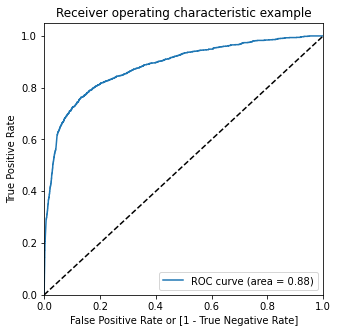

In [309]:
draw_roc(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

In [310]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,id,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
40436,0,0.209998,40436,0,1,1,1,0,0,0,0,0,0,0
21495,0,0.034423,21495,0,1,0,0,0,0,0,0,0,0,0
13005,0,0.016967,13005,0,1,0,0,0,0,0,0,0,0,0
58778,0,0.039063,58778,0,1,0,0,0,0,0,0,0,0,0
31475,0,0.000461,31475,0,1,0,0,0,0,0,0,0,0,0


In [311]:

# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.087625  1.000000  0.000000
0.1   0.1  0.799959  0.815047  0.798510
0.2   0.2  0.915671  0.651254  0.941066
0.3   0.3  0.930298  0.369906  0.984119
0.4   0.4  0.930504  0.311129  0.989989
0.5   0.5  0.930779  0.298589  0.991495
0.6   0.6  0.931122  0.292320  0.992473
0.7   0.7  0.931809  0.290752  0.993376
0.8   0.8  0.924804  0.163009  0.997968
0.9   0.9  0.914984  0.032915  0.999699


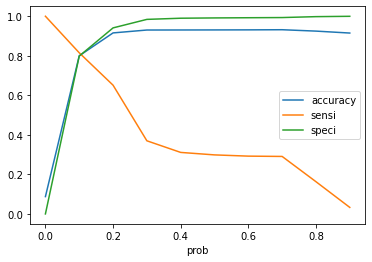

In [312]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

In [313]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.1 else 0)

y_train_pred_final.head()

,Churn,Churn_Prob,id,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
40436,0,0.209998,40436,0,1,1,1,0,0,0,0,0,0,0,1
21495,0,0.034423,21495,0,1,0,0,0,0,0,0,0,0,0,0
13005,0,0.016967,13005,0,1,0,0,0,0,0,0,0,0,0,0
58778,0,0.039063,58778,0,1,0,0,0,0,0,0,0,0,0,0
31475,0,0.000461,31475,0,1,0,0,0,0,0,0,0,0,0,0


In [314]:

# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted)

0.799958796868562

In [315]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.final_predicted )
confusion2

array([[10609,  2677],
       [  236,  1040]], dtype=int64)

In [316]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [317]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)


0.8150470219435737

In [318]:
# Let us calculate specificity
TN / float(TN+FP)

0.7985097094686135

In [319]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.20149029053138642


In [320]:
# Positive predictive value 
print (TP / float(TP+FP))

0.27979553403282215


In [321]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9782388197325956


In [322]:
#Using sklearn utilities for the same

from sklearn.metrics import precision_score, recall_score

In [323]:

precision_score(y_train_pred_final.Churn, y_train_pred_final.predicted)

0.771255060728745

In [324]:
recall_score(y_train_pred_final.Churn, y_train_pred_final.predicted)

0.29858934169278994

In [383]:
from sklearn.metrics import precision_recall_curve
#churn=1

In [384]:
y_train_pred_final.Churn, y_train_pred_final.predicted

(40436    0
 21495    0
 13005    0
 58778    0
 31475    0
 28314    0
 1136     0
 17787    0
 48054    0
 34616    0
 49417    0
 40031    0
 14222    0
 33249    0
 7520     0
 61275    0
 5425     0
 57888    0
 6351     0
 39314    0
 42773    0
 7405     0
 68523    0
 16422    0
 14700    1
 19639    0
 3168     0
 38175    0
 58283    0
 18959    0
 68990    0
 59909    0
 20728    0
 1172     0
 51257    0
 9169     0
 60517    0
 61413    0
 41001    0
 42574    0
 67292    0
 4280     1
 21359    0
 18498    0
 12227    0
 7780     1
 29687    0
 64721    0
 50049    0
 63835    0
 32196    0
 19574    0
 27262    0
 27721    0
 13075    0
 22782    0
 15774    0
 24481    0
 45222    0
 4252     0
 55795    0
 1475     0
 35644    0
 2810     0
 69255    0
 29649    0
 68351    0
 21369    1
 35453    0
 28653    0
 40521    0
 68322    0
 26154    0
 7179     0
 61034    0
 28031    0
 49079    0
 41498    0
 28744    0
 20083    0
 20888    0
 38966    0
 68269    0
 374

In [385]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

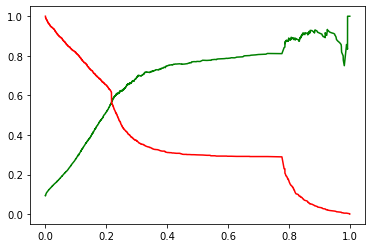

In [386]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

In [387]:


num_cols = [col for col in X_test.columns if col not in ['id', 'churn_probability']]

X_test[num_cols] = scaler.transform(X_test[num_cols])

In [388]:
X_test = X_test[cols_supported]
X_test.head()

,std_og_mou_8,og_others_7,total_og_mou_8,loc_ic_mou_8,std_ic_mou_8,total_ic_mou_7,total_ic_mou_8,isd_ic_mou_8
24038,-0.281456,-0.032916,-0.137238,0.306903,0.160955,-0.187660,0.338598,-0.021082
1977,-0.618589,-0.032916,-0.260485,0.844914,-0.369057,1.004704,0.566420,-0.168221
63500,-0.579839,-0.032916,-0.801039,-0.773706,-0.376701,-0.590925,-0.814073,-0.168221
17243,-0.468309,-0.032916,-0.803596,-0.725494,-0.376303,-0.874528,-0.772892,-0.168221
48937,-0.596018,-0.032916,-0.659473,0.362589,-0.176782,0.205595,0.249471,-0.048378


In [389]:




X_test_sm = sm.add_constant(X_test)

In [390]:

y_test_pred = res.predict(X_test_sm)

In [391]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [392]:
# Let's see the head
y_pred_1.head()# Let's see the head


,0
24038,0.004341
1977,0.004317
63500,0.209174
17243,0.171974
48937,0.014015


In [393]:




# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [394]:
# Putting CustID to index
y_test_df['id'] = y_test_df.index

In [395]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [396]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [397]:
y_pred_final.head()

,churn_probability,id,0
0,0,24038,0.004341
1,0,1977,0.004317
2,0,63500,0.209174
3,0,17243,0.171974
4,0,48937,0.014015


In [398]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})

In [399]:
# Rearranging the columns
y_pred_final = y_pred_final.reindex(['id','churn_probability','Churn_Prob'], axis=1)

In [400]:
# Let's see the head of y_pred_final
y_pred_final.head()

,id,churn_probability,Churn_Prob
0,24038,0,0.004341
1,1977,0,0.004317
2,63500,0,0.209174
3,17243,0,0.171974
4,48937,0,0.014015


In [401]:
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.42 else 0)

In [402]:
y_pred_final.head()

,id,churn_probability,Churn_Prob,final_predicted
0,24038,0,0.004341,0
1,1977,0,0.004317,0
2,63500,0,0.209174,0
3,17243,0,0.171974,0
4,48937,0,0.014015,0


In [403]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.churn_probability, y_pred_final.final_predicted)

0.9286973241467713

In [404]:
confusion2 = metrics.confusion_matrix(y_pred_final.churn_probability, y_pred_final.final_predicted )
confusion2

array([[5618,   64],
       [ 381,  178]], dtype=int64)

## Decision Tree


In [405]:
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

In [406]:
dt = DecisionTreeClassifier(random_state=42)

In [407]:


dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [408]:
#y_train_pred = dt.predict(X_train_final)

#y_train_pred[:6]
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

In [409]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

In [410]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [411]:

grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 50 candidates, totalling 200 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [412]:
grid_search.best_estimator_

DecisionTreeClassifier(max_depth=3, min_samples_leaf=100, random_state=42)

In [413]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz
from sklearn.metrics import confusion_matrix, accuracy_score

In [414]:
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=X.columns, 
                    class_names=['Churn', "No Churn"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [415]:
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train, dt_classifier.predict(X_train)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_classifier.predict(X_train)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test)))

In [416]:
dt_best = grid_search.best_estimator_

In [417]:
evaluate_model(dt_best)

Train Accuracy : 0.9388820217003159
Train Confusion Matrix:
[[13044   242]
 [  648   628]]
--------------------------------------------------
Test Accuracy : 0.9381509373497837
Test Confusion Matrix:
[[5576  106]
 [ 280  279]]


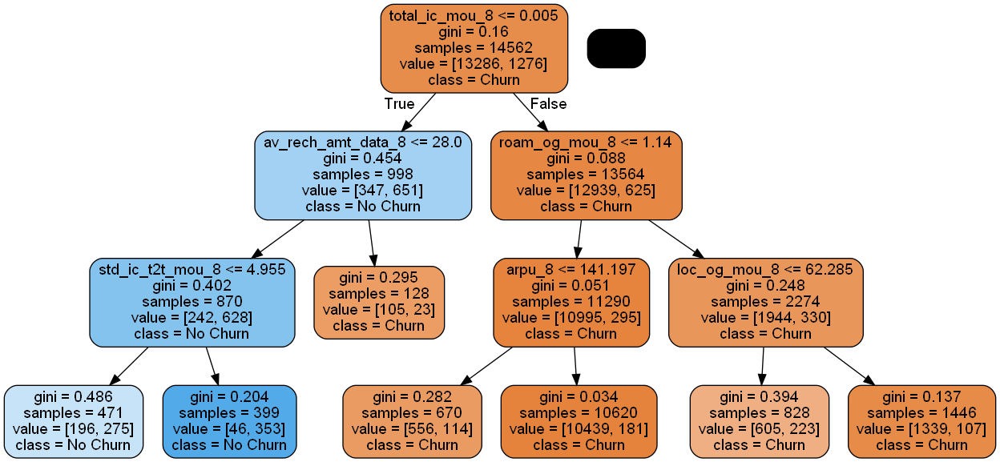

In [418]:
gph = get_dt_graph(dt_best)
Image(gph.create_png())

In [419]:
from sklearn.metrics import classification_report

In [420]:
print(classification_report(y_test, dt_best.predict(X_test)))

              precision    recall  f1-score   support

           0       0.95      0.98      0.97      5682
           1       0.72      0.50      0.59       559

    accuracy                           0.94      6241
   macro avg       0.84      0.74      0.78      6241
weighted avg       0.93      0.94      0.93      6241



In [421]:
dt_min_leaf_entropy = DecisionTreeClassifier(min_samples_leaf=100, random_state=42, criterion="entropy")
dt_min_leaf_entropy.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', min_samples_leaf=100,
                       random_state=42)

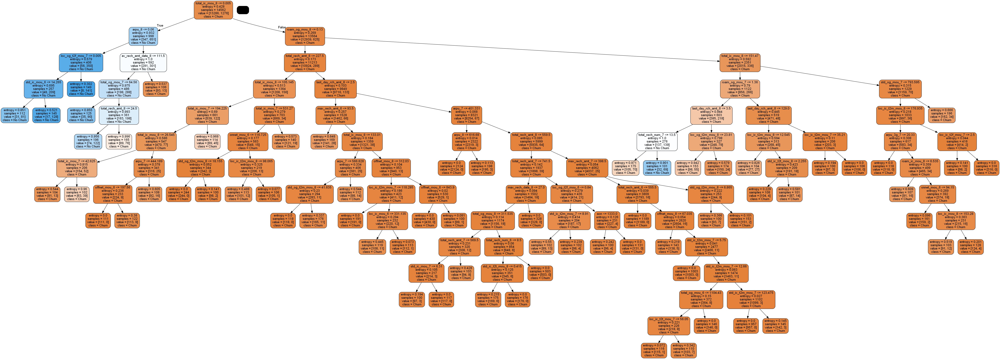

In [422]:
gph = get_dt_graph(dt_min_leaf_entropy)
Image(gph.create_png())

In [365]:
evaluate_model(dt_min_leaf_entropy)

Train Accuracy : 0.942178272215355
Train Confusion Matrix:
[[13089   197]
 [  645   631]]
--------------------------------------------------
Test Accuracy : 0.9373497836885114
Test Confusion Matrix:
[[5585   97]
 [ 294  265]]


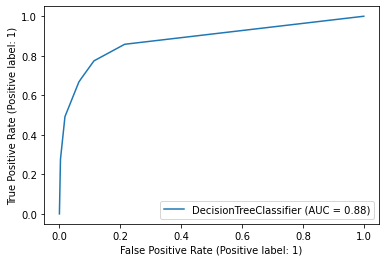

In [366]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(dt_best, X_train, y_train)
plt.show()

In [367]:
feature_names = dt_min_leaf_entropy.feature_names_in_

In [368]:
print(len(feature_names))# features selected by Decision Tree Classifier

160


## Random Forest

In [369]:
rf = RandomForestClassifier(random_state=42, n_estimators=10, max_depth=3)

In [370]:
rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=3, n_estimators=10, random_state=42)

In [371]:
rf.estimators_[0]

DecisionTreeClassifier(max_depth=3, max_features='auto',
                       random_state=1608637542)

In [372]:
sample_tree = rf.estimators_[4]# standard decision tree

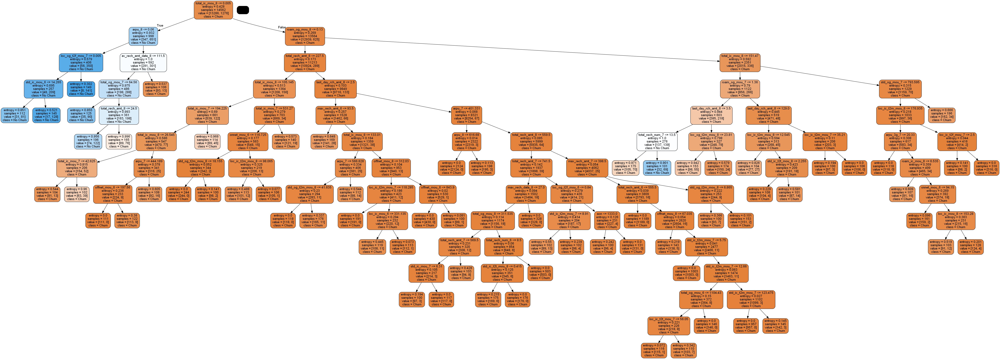

In [373]:
ph = get_dt_graph(sample_tree)
Image(gph.create_png(), width=700, height=700)

In [374]:
evaluate_model(rf)

Train Accuracy : 0.9366845213569565
Train Confusion Matrix:
[[13194    92]
 [  830   446]]
--------------------------------------------------
Test Accuracy : 0.9355872456337125
Test Confusion Matrix:
[[5644   38]
 [ 364  195]]


In [375]:
rf = RandomForestClassifier(random_state=42, n_estimators=10, max_depth=3,oob_score=True)

In [376]:
rf.fit(X_train,y_train)

RandomForestClassifier(max_depth=3, n_estimators=10, oob_score=True,
                       random_state=42)

In [377]:
rf.oob_score_# avg value of oob score for all the different trees

0.9333882708419173

In [378]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [1, 2, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'max_features': [2,3,4],
    'n_estimators': [10, 30, 50, 100, 200]
}

In [379]:
classifier_rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [380]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=classifier_rf, param_grid=params, 
                          cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [381]:
%%time
grid_search.fit(X,y)

Fitting 4 folds for each of 375 candidates, totalling 1500 fits
CPU times: total: 15.3 s
Wall time: 20min 48s


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [1, 2, 5, 10, 20],
                         'max_features': [2, 3, 4],
                         'min_samples_leaf': [5, 10, 20, 50, 100],
                         'n_estimators': [10, 30, 50, 100, 200]},
             scoring='accuracy', verbose=1)

In [382]:
rf_best = grid_search.best_estimator_

In [423]:
rf_best

RandomForestClassifier(max_depth=20, max_features=4, min_samples_leaf=5,
                       n_estimators=50, n_jobs=-1, random_state=42)

In [424]:
evaluate_model(rf_best)

Train Accuracy : 0.953646477132262
Train Confusion Matrix:
[[13209    77]
 [  598   678]]
--------------------------------------------------
Test Accuracy : 0.9530523954494472
Test Confusion Matrix:
[[5647   35]
 [ 258  301]]


In [425]:
gph = get_dt_graph(rf_best.estimators_[10])
Image(gph.create_png(), height=600, width=600)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.824058 to fit



In [426]:
classifier_rf = RandomForestClassifier(random_state=42, n_jobs=-1, max_depth=20, n_estimators=50, oob_score=True,min_samples_leaf=5)

In [427]:
classifier_rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=20, min_samples_leaf=5, n_estimators=50,
                       n_jobs=-1, oob_score=True, random_state=42)

In [428]:
classifier_rf.feature_importances_

array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 7.10114563e-03,
       8.63696108e-03, 5.19439916e-02, 5.93963972e-03, 6.70790028e-03,
       4.18389220e-03, 5.43116616e-03, 6.02650286e-03, 1.95054890e-02,
       3.05035535e-03, 6.39812840e-03, 4.59560418e-02, 1.52045137e-03,
       5.22083248e-03, 3.60089413e-02, 6.60533188e-03, 6.00309567e-03,
       9.92103074e-03, 4.85558282e-03, 6.10408550e-03, 1.25499437e-02,
       2.21871225e-03, 2.50940324e-03, 2.91392384e-03, 1.39396013e-03,
       2.38836243e-03, 4.14295910e-03, 6.16886695e-03, 7.50863881e-03,
       1.69580632e-02, 7.18449960e-03, 6.66006181e-03, 7.04813961e-03,
       4.79441479e-03, 5.62948791e-03, 6.80325765e-03, 2.79788455e-04,
       4.24130506e-04, 5.18735653e-03, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 6.70487849e-03, 6.40171436e-03, 1.63062543e-02,
       6.97778665e-04, 1.00309859e-03, 1.64078073e-02, 5.55780086e-03,
       4.35109612e-03, 5.39900858e-03, 2.27050282e-03, 0.00000000e+00,
      

In [429]:
imp_df = pd.DataFrame({
    "Varname": X_train.columns,
    "Imp": classifier_rf.feature_importances_
})

In [430]:
imp_df.sort_values(by="Imp", ascending=False)

,Varname,Imp
59,total_og_mou_8,7.325110e-02
5,arpu_8,5.194399e-02
14,roam_ic_mou_8,4.595604e-02
104,total_rech_amt_8,4.464304e-02
107,max_rech_amt_8,4.430260e-02
89,total_ic_mou_8,3.938556e-02
17,roam_og_mou_8,3.600894e-02
110,last_day_rch_amt_8,2.563292e-02
71,loc_ic_mou_8,2.509509e-02
65,loc_ic_t2m_mou_8,2.504297e-02


In [431]:
len(imp_df)

160

In [432]:
X_train.shape

(14562, 160)

In [433]:
#sns.countplot(imp_df)

In [434]:
#scaler = StandardScaler()

# fit_tran
#df_scaled = scaler.fit_transform(data)
#df_scaled.shape

In [435]:
#df_scaled = pd.DataFrame(df_scaled)
#df_scaled.columns =data.columns

In [436]:
#df_scaled.head()

In [437]:
#df_scaled.drop('id',axis=1,inplace=True)

In [438]:
# k-means with some arbitrary k
#kmeans = KMeans(n_clusters=4, max_iter=50)
#kmeans.fit(df_scaled)

In [439]:
#kmeans.labels_

In [440]:
# elbow-curve/SSD
#ssd = []
#range_n_clusters = [2, 3, 4, 5, 6, 7, 8]
#for num_clusters in range_n_clusters:
#kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
#    kmeans.fit(df_scaled)
    
 #   ssd.append(kmeans.inertia_)
    
# plot the SSDs for each n_clusters
# ssd
#plt.plot(range_n_clusters,ssd)
# as u increase no of clusters SSD will decrease
#after a point adding another cluster does not reduce the value od ssd by significant amount u say that there no point adding another cluster

In [441]:
# silhouette analysis
#range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

#for num_clusters in range_n_clusters:
    
    # intialise kmeans
   # kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
   # kmeans.fit(rfm_df_scaled)
    
   # cluster_labels = kmeans.labels_
    
    # silhouette score
   ## silhouette_avg = silhouette_score(df_scaled, cluster_labels)
   # print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

In [442]:
# final model with k=3
#kmeans = KMeans(n_clusters=3, max_iter=50)
#kmeans.fit(df_scaled)

In [443]:
# assign the label
#data['cluster_id'] = kmeans.labels_
#data.head()# since we have 3 cluster we have vals from 0,1,2

In [444]:
#data['avg_of_june_july']=data['max_rech_amt_6']+data['max_rech_amt_7']/2

In [445]:
# plot
#sns.boxplot(x='cluster_id', y='avg_of_june_july', data=data)

In [446]:
#sns.scatterplot(data['max_rech_amt_7'],data['max_rech_amt_6'],hue='cluster_id',data=data) 


#plt.show()

In [447]:
#developed=data[data['cluster_id']==1]['id']

In [448]:
#developed

In [449]:
#data.avg_of_june_july

In [623]:
df=pd.read_csv('test.csv')

In [624]:
df.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,6/21/2014,7/26/2014,8/24/2014,30,30,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1692,0.00,0.00,0.00
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,6/19/2014,7/16/2014,8/24/2014,250,0,0,NaN,NaN,Na

In [625]:
df.isnull().sum()/len(df)*100

id                           0.000000
circle_id                    0.000000
loc_og_t2o_mou               1.053333
std_og_t2o_mou               1.053333
loc_ic_t2o_mou               1.053333
last_date_of_month_6         0.000000
last_date_of_month_7         0.673333
last_date_of_month_8         1.223333
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  3.896667
onnet_mou_7                  3.906667
onnet_mou_8                  5.583333
offnet_mou_6                 3.896667
offnet_mou_7                 3.906667
offnet_mou_8                 5.583333
roam_ic_mou_6                3.896667
roam_ic_mou_7                3.906667
roam_ic_mou_8                5.583333
roam_og_mou_6                3.896667
roam_og_mou_7                3.906667
roam_og_mou_8                5.583333
loc_og_t2t_mou_6             3.896667
loc_og_t2t_mou_7             3.906667
loc_og_t2t_mou_8             5.583333
loc_og_t2m_m

In [626]:
df.drop(['circle_id'],axis=1,inplace=True)

In [627]:
# Extract the "id" column into a separate Pandas series
id_col = df["id"]

# Print the first few rows of the "id" column
print(id_col.head())

0    69999
1    70000
2    70001
3    70002
4    70003
Name: id, dtype: int64


In [629]:
df.drop('id',axis=1)

KeyboardInterrupt: 

In [630]:

df['loc_og_t2o_mou'].fillna(df['loc_og_t2o_mou'].mean(), inplace=True)

In [631]:
df['std_og_t2o_mou'].fillna(df['std_og_t2o_mou'].mean(), inplace=True)

In [632]:
df.isnull().sum()/len(df)*100

id                           0.000000
loc_og_t2o_mou               0.000000
std_og_t2o_mou               0.000000
loc_ic_t2o_mou               1.053333
last_date_of_month_6         0.000000
last_date_of_month_7         0.673333
last_date_of_month_8         1.223333
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  3.896667
onnet_mou_7                  3.906667
onnet_mou_8                  5.583333
offnet_mou_6                 3.896667
offnet_mou_7                 3.906667
offnet_mou_8                 5.583333
roam_ic_mou_6                3.896667
roam_ic_mou_7                3.906667
roam_ic_mou_8                5.583333
roam_og_mou_6                3.896667
roam_og_mou_7                3.906667
roam_og_mou_8                5.583333
loc_og_t2t_mou_6             3.896667
loc_og_t2t_mou_7             3.906667
loc_og_t2t_mou_8             5.583333
loc_og_t2m_mou_6             3.896667
loc_og_t2m_m

In [633]:
df['loc_ic_t2o_mou'].fillna(df['loc_ic_t2o_mou'].mean(), inplace=True)

In [634]:
df.drop('last_date_of_month_7',axis=1,inplace=True)

In [635]:
df.drop('last_date_of_month_6',axis=1,inplace=True)

In [636]:
df.drop('last_date_of_month_8',axis=1,inplace=True)

In [637]:
df['onnet_mou_6'].fillna(df['onnet_mou_6'].mean(), inplace=True)

In [638]:
df['onnet_mou_7'].fillna(df['onnet_mou_7'].mean(), inplace=True)

In [639]:
df['onnet_mou_8'].fillna(df['onnet_mou_8'].mean(), inplace=True)

In [640]:
df.isnull().sum()/len(df)*100

id                           0.000000
loc_og_t2o_mou               0.000000
std_og_t2o_mou               0.000000
loc_ic_t2o_mou               0.000000
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  0.000000
onnet_mou_7                  0.000000
onnet_mou_8                  0.000000
offnet_mou_6                 3.896667
offnet_mou_7                 3.906667
offnet_mou_8                 5.583333
roam_ic_mou_6                3.896667
roam_ic_mou_7                3.906667
roam_ic_mou_8                5.583333
roam_og_mou_6                3.896667
roam_og_mou_7                3.906667
roam_og_mou_8                5.583333
loc_og_t2t_mou_6             3.896667
loc_og_t2t_mou_7             3.906667
loc_og_t2t_mou_8             5.583333
loc_og_t2m_mou_6             3.896667
loc_og_t2m_mou_7             3.906667
loc_og_t2m_mou_8             5.583333
loc_og_t2f_mou_6             3.896667
loc_og_t2f_m

In [641]:
df['offnet_mou_8'].fillna(df['offnet_mou_8'].mean(), inplace=True)

In [642]:
df['offnet_mou_7'].fillna(df['offnet_mou_7'].mean(), inplace=True)

In [643]:
df['offnet_mou_6'].fillna(df['offnet_mou_6'].mean(), inplace=True)

In [644]:
df['roam_ic_mou_6'].fillna(df['roam_ic_mou_6'].mean(), inplace=True)

In [645]:
df['roam_ic_mou_7'].fillna(df['roam_ic_mou_7'].mean(), inplace=True)

In [646]:
df['roam_ic_mou_6'].fillna(df['roam_ic_mou_6'].mean(), inplace=True)

In [647]:
df['roam_ic_mou_8'].fillna(df['roam_ic_mou_8'].mean(), inplace=True)

In [648]:
df['loc_og_t2t_mou_6'].fillna(df['loc_og_t2t_mou_6'].mean(),inplace=True)

In [649]:
df['loc_og_t2t_mou_7'].fillna(df['loc_og_t2t_mou_7'].mean(),inplace=True)

In [650]:
df.isnull().sum()/len(df)*100

id                           0.000000
loc_og_t2o_mou               0.000000
std_og_t2o_mou               0.000000
loc_ic_t2o_mou               0.000000
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  0.000000
onnet_mou_7                  0.000000
onnet_mou_8                  0.000000
offnet_mou_6                 0.000000
offnet_mou_7                 0.000000
offnet_mou_8                 0.000000
roam_ic_mou_6                0.000000
roam_ic_mou_7                0.000000
roam_ic_mou_8                0.000000
roam_og_mou_6                3.896667
roam_og_mou_7                3.906667
roam_og_mou_8                5.583333
loc_og_t2t_mou_6             0.000000
loc_og_t2t_mou_7             0.000000
loc_og_t2t_mou_8             5.583333
loc_og_t2m_mou_6             3.896667
loc_og_t2m_mou_7             3.906667
loc_og_t2m_mou_8             5.583333
loc_og_t2f_mou_6             3.896667
loc_og_t2f_m

In [651]:
df['roam_og_mou_6'].fillna(df['roam_og_mou_6'].mean(),inplace=True)

In [652]:
df['roam_og_mou_7'].fillna(df['roam_og_mou_7'].mean(),inplace=True)

In [653]:
df['roam_og_mou_8'].fillna(df['roam_og_mou_8'].mean(),inplace=True)

In [654]:
df['loc_og_t2t_mou_8'].fillna(df['loc_og_t2t_mou_8'].mean(),inplace=True)

In [655]:
df['loc_og_t2t_mou_6'].fillna(df['loc_og_t2t_mou_6'].mean(),inplace=True)

In [656]:
df['loc_og_t2t_mou_7'].fillna(df['loc_og_t2t_mou_7'].mean(),inplace=True)

In [657]:
df.isnull().sum()/len(df)*100

id                           0.000000
loc_og_t2o_mou               0.000000
std_og_t2o_mou               0.000000
loc_ic_t2o_mou               0.000000
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  0.000000
onnet_mou_7                  0.000000
onnet_mou_8                  0.000000
offnet_mou_6                 0.000000
offnet_mou_7                 0.000000
offnet_mou_8                 0.000000
roam_ic_mou_6                0.000000
roam_ic_mou_7                0.000000
roam_ic_mou_8                0.000000
roam_og_mou_6                0.000000
roam_og_mou_7                0.000000
roam_og_mou_8                0.000000
loc_og_t2t_mou_6             0.000000
loc_og_t2t_mou_7             0.000000
loc_og_t2t_mou_8             0.000000
loc_og_t2m_mou_6             3.896667
loc_og_t2m_mou_7             3.906667
loc_og_t2m_mou_8             5.583333
loc_og_t2f_mou_6             3.896667
loc_og_t2f_m

In [658]:
df.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8'],axis=1,inplace=True)

In [659]:



missing_percentages = df.isna().sum() / len(df) * 100


for col in df.columns:
    if missing_percentages[col] < 30:
        
        df[col].fillna(df[col].mean(), inplace=True)


In [660]:
df.isnull().sum()/len(df)*100

id                           0.000000
loc_og_t2o_mou               0.000000
std_og_t2o_mou               0.000000
loc_ic_t2o_mou               0.000000
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  0.000000
onnet_mou_7                  0.000000
onnet_mou_8                  0.000000
offnet_mou_6                 0.000000
offnet_mou_7                 0.000000
offnet_mou_8                 0.000000
roam_ic_mou_6                0.000000
roam_ic_mou_7                0.000000
roam_ic_mou_8                0.000000
roam_og_mou_6                0.000000
roam_og_mou_7                0.000000
roam_og_mou_8                0.000000
loc_og_t2t_mou_6             0.000000
loc_og_t2t_mou_7             0.000000
loc_og_t2t_mou_8             0.000000
loc_og_t2m_mou_6             0.000000
loc_og_t2m_mou_7             0.000000
loc_og_t2m_mou_8             0.000000
loc_og_t2f_mou_6             0.000000
loc_og_t2f_m

In [661]:
df['total_rech_data_6']=df['total_rech_data_6'].fillna(0)

In [662]:
df['total_rech_data_7']=df['total_rech_data_7'].fillna(0)

In [663]:
df['total_rech_data_8']=df['total_rech_data_8'].fillna(0)

In [664]:
df['max_rech_data_6']=df['max_rech_data_6'].fillna(0)

In [665]:
df['max_rech_data_7']=df['max_rech_data_7'].fillna(0)

In [666]:
df['max_rech_data_8']=df['max_rech_data_8'].fillna(0)

In [667]:
df['count_rech_2g_6']=df['count_rech_2g_6'].fillna(0)

In [668]:
df['count_rech_2g_7']=df['count_rech_2g_7'].fillna(0)

In [669]:
df['count_rech_2g_8']=df['count_rech_2g_8'].fillna(0)

In [670]:
df['count_rech_3g_6']=df['count_rech_3g_6'].fillna(0)

In [671]:
df['count_rech_3g_7']=df['count_rech_3g_7'].fillna(0)

In [672]:
df['count_rech_3g_8']=df['count_rech_3g_8'].fillna(0)

In [673]:
df.isnull().sum()/len(df)*100

id                           0.000000
loc_og_t2o_mou               0.000000
std_og_t2o_mou               0.000000
loc_ic_t2o_mou               0.000000
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  0.000000
onnet_mou_7                  0.000000
onnet_mou_8                  0.000000
offnet_mou_6                 0.000000
offnet_mou_7                 0.000000
offnet_mou_8                 0.000000
roam_ic_mou_6                0.000000
roam_ic_mou_7                0.000000
roam_ic_mou_8                0.000000
roam_og_mou_6                0.000000
roam_og_mou_7                0.000000
roam_og_mou_8                0.000000
loc_og_t2t_mou_6             0.000000
loc_og_t2t_mou_7             0.000000
loc_og_t2t_mou_8             0.000000
loc_og_t2m_mou_6             0.000000
loc_og_t2m_mou_7             0.000000
loc_og_t2m_mou_8             0.000000
loc_og_t2f_mou_6             0.000000
loc_og_t2f_m

In [674]:
df['arpu_3g_6'].fillna(df['arpu_3g_6'].mean(), inplace=True)

In [675]:
df['arpu_3g_7'].fillna(df['arpu_3g_7'].mean(), inplace=True)

In [676]:
df['arpu_3g_8'].fillna(df['arpu_3g_8'].mean(), inplace=True)

In [677]:
df['arpu_2g_6'].fillna(df['arpu_2g_6'].mean(), inplace=True)

In [678]:
df['arpu_2g_7'].fillna(df['arpu_2g_7'].mean(), inplace=True)

In [679]:
df['arpu_2g_8'].fillna(df['arpu_2g_8'].mean(), inplace=True)

In [680]:
df.isnull().sum()/len(df)*100

id                           0.000000
loc_og_t2o_mou               0.000000
std_og_t2o_mou               0.000000
loc_ic_t2o_mou               0.000000
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  0.000000
onnet_mou_7                  0.000000
onnet_mou_8                  0.000000
offnet_mou_6                 0.000000
offnet_mou_7                 0.000000
offnet_mou_8                 0.000000
roam_ic_mou_6                0.000000
roam_ic_mou_7                0.000000
roam_ic_mou_8                0.000000
roam_og_mou_6                0.000000
roam_og_mou_7                0.000000
roam_og_mou_8                0.000000
loc_og_t2t_mou_6             0.000000
loc_og_t2t_mou_7             0.000000
loc_og_t2t_mou_8             0.000000
loc_og_t2m_mou_6             0.000000
loc_og_t2m_mou_7             0.000000
loc_og_t2m_mou_8             0.000000
loc_og_t2f_mou_6             0.000000
loc_og_t2f_m

In [681]:
len(df)

30000

In [682]:
df.shape

(30000, 164)

In [683]:
df['night_pck_user_6'].fillna(df['night_pck_user_6'].mode()[0], inplace=True)

In [684]:
df['night_pck_user_7'].fillna(df['night_pck_user_7'].mode()[0], inplace=True)

In [685]:
df['night_pck_user_8'].fillna(df['night_pck_user_8'].mode()[0], inplace=True)

In [686]:
df['fb_user_6'].fillna(df['fb_user_6'].mode()[0], inplace=True)

In [687]:
df['fb_user_7'].fillna(df['fb_user_7'].mode()[0], inplace=True)

In [688]:
df['fb_user_8'].fillna(df['fb_user_8'].mode()[0], inplace=True)

In [689]:
df.drop('date_of_last_rech_data_6',axis=1,inplace=True)

In [690]:
df.drop('date_of_last_rech_data_7',axis=1,inplace=True)

In [691]:
df.drop('date_of_last_rech_data_8',axis=1,inplace=True)

In [693]:
df.drop('id',axis=1,inplace=True)

In [694]:
df.isnull().sum()/len(df)*100

loc_og_t2o_mou         0.000000
std_og_t2o_mou         0.000000
loc_ic_t2o_mou         0.000000
arpu_6                 0.000000
arpu_7                 0.000000
arpu_8                 0.000000
onnet_mou_6            0.000000
onnet_mou_7            0.000000
onnet_mou_8            0.000000
offnet_mou_6           0.000000
offnet_mou_7           0.000000
offnet_mou_8           0.000000
roam_ic_mou_6          0.000000
roam_ic_mou_7          0.000000
roam_ic_mou_8          0.000000
roam_og_mou_6          0.000000
roam_og_mou_7          0.000000
roam_og_mou_8          0.000000
loc_og_t2t_mou_6       0.000000
loc_og_t2t_mou_7       0.000000
loc_og_t2t_mou_8       0.000000
loc_og_t2m_mou_6       0.000000
loc_og_t2m_mou_7       0.000000
loc_og_t2m_mou_8       0.000000
loc_og_t2f_mou_6       0.000000
loc_og_t2f_mou_7       0.000000
loc_og_t2f_mou_8       0.000000
loc_og_t2c_mou_6       0.000000
loc_og_t2c_mou_7       0.000000
loc_og_t2c_mou_8       0.000000
loc_og_mou_6           0.000000
loc_og_m

In [698]:
df['av_rech_amt_data_7']=df['av_rech_amt_data_7'].fillna(0)

In [699]:
df['av_rech_amt_data_8']=df['av_rech_amt_data_8'].fillna(0)

In [700]:
df['av_rech_amt_data_6']=df['av_rech_amt_data_6'].fillna(0)

##### df.isnull().sum()/len(df)*100

In [701]:
num_cols = [col for col in df.columns if col not in ['id', 'churn_probability']]


In [702]:

df[num_cols] = scaler.transform(df[num_cols])

In [703]:
test_predictions = classifier_rf.predict(df)

In [704]:
y_pred_1 = pd.DataFrame(test_predictions)
# Let's see the head

In [705]:
y_pred_1.head()

,0
0,0
1,0
2,1
3,0
4,0


In [706]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([id_col, y_pred_1],axis=1)

In [707]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [708]:
y_pred_final.head()

,id,0
0,69999,0
1,70000,0
2,70001,1
3,70002,0
4,70003,0


In [709]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Probability'})

In [710]:
# Rearranging the columns
y_pred_final = y_pred_final.reindex(['id','Churn_Probability'], axis=1)

In [711]:
submission_cols=y_pred_final

In [713]:
#submission_cols.head()

In [714]:
submission_cols.to_csv('submissions.csv', index=False)
